In [3]:
suppressPackageStartupMessages(library(dplyr))
library(ggplot2)
library(ggdendro)
library(pheatmap)
library(RColorBrewer)

library(anndata)
suppressPackageStartupMessages(library(Seurat))

source("/projects/ps-renlab2/y2xie/scripts/basics.R")
source("/projects/ps-renlab2/y2xie/scripts/DPT_help.R")
source("/projects/ps-renlab2/y2xie/scripts/DPT/BICAN_help.R")

### this is just to resize jupyter notebook plot size
library(repr)

Warning message:
“package ‘pheatmap’ was built under R version 4.4.3”
Warning message:
“package ‘SeuratObject’ was built under R version 4.4.3”
Warning message:
“package ‘sp’ was built under R version 4.4.2”
Warning message:
“package ‘scales’ was built under R version 4.4.3”
Warning message:
“package ‘Matrix’ was built under R version 4.4.3”
Loading required package: viridisLite


Attaching package: ‘viridis’


The following object is masked from ‘package:scales’:

    viridis_pal




In [27]:
library(future)
library(future.apply)

plan(multisession(workers = 16))
options(future.globals.maxSize= 196000*1024^2)

In [4]:
### Add brain region color
cols <- read.csv("../../ref/yel_Science2023_supp/brain_dissection_anno.xls", sep = "\t")
col1 <- cols %>% select(Brain.structure.name, Brain.structure.color) %>% distinct %>% select(Brain.structure.color) %>% unlist
names(col1) <- cols %>% select(Brain.structure.name, Brain.structure.color) %>% distinct %>% select(Brain.structure.name) %>% unlist

col2 <- cols %>% select(Brain.region, Brain.region.color) %>% distinct %>% select(Brain.region.color) %>% unlist
names(col2) <- cols %>% select(Brain.region, Brain.region.color) %>% distinct %>% select(Brain.region) %>% unlist

In [37]:
cols <- read.csv("./ref/yel_Science2023_supp/subclass_celltype_match.csv")
tmp <- distinct(cols[,c("Cell.class", "Cell.class.color")])
ccol1 <- tmp$Cell.class.color
names(ccol1) <- gsub("GLUT", "Glut", tmp$Cell.class)

tmp <- read.csv("./analysis/04.clustering/subclass_corrected.color.csv", row.names = 1)
ccol2 <- tmp$color
names(ccol2) <- tmp$MiniAtlas

In [35]:
tmp <- read.csv("./analysis/04.clustering/cluster_manual_name.color.csv", row.names = 1)
ccol4 <- tmp$color
names(ccol4) <- tmp$cluster_manual_name

In [7]:
bcol <- read.csv("./Figure/superterm.color", row.names = 1, sep = "\t")
ccol3 <- bcol$bcol
names(ccol3) <- rownames(bcol)

In [10]:
hg38 <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/Paired-Tag/hg38/hg38.v43.10X.bed")
hg38t <- read.table("/projects/ps-renlab2/y2xie/ps-renlab/y2xie/projects/genome_ref/refdata-cellranger-GRCh38.p13_v43/GRCh38/genes/tss_1500bp.bed")

## Read l3 clustering results

In [8]:
### rna data
mmg <- qs::qread("02.RNA/03.l3_clustering/MiniAtlas_RNA_merged_dual_filt_clean_corrected_250529.qs")
mmg

An object of class Seurat 
38369 features across 751077 samples within 1 assay 
Active assay: RNA (38369 features, 5572 variable features)
 3 layers present: data, counts, scale.data
 9 dimensional reductions calculated: pca, harmony, umap, k27ac_umap, k27me3_umap, k27ac_spectral_harmony, k27ac_umap_new, k27me3_spectral_harmony, k27me3_umap_new

In [18]:
### histone data
ac <- read_h5ad("01.DNA/MiniAtlas_H3K27ac_merged_dual_filt_clean_keep_250602.h5ad")
me3 <- read_h5ad("01.DNA/MiniAtlas_H3K27me3_merged_dual_filt_clean_keep_250602.h5ad")

In [8]:
lmeta <- read.csv("./analysis/04.clustering/02.RNA/03.l3_clustering/MiniAtlas_RNA_merged_dual_filt_clean_corrected_250722_metadata.txt", 
                  sep = "\t", row.names = 1)
dim(lmeta)

dcol <- c("#8ecae6", "#00acdf", "#006699")
names(dcol) <- unique(lmeta$donor)

tcol <- c("#2EA7E0", "#956134")
names(tcol) <- c("H3K27ac", "H3K27me3")

[1] 751077     39

## Plot NeuN+ enrichment performance

In [ ]:
### Calculate the expected ratio based on Yang Li results
original_ratio <- read.csv("../../ref/hba_ATAC/hba_merged.metadata.csv", header = T, row.names = 1) %>%
select(subclass) %>% table %>% as.data.frame
pair_df <- read.table("../06.integration/snATAC_DPT_RNA_250722.pred_subclass_match.simplify.txt", col.names = c("MiniAtlas", "YELi"))
cortex_sample <- lmeta %>% filter(structure == "Cortex") %>% select(subclass_corrected) %>% 
table %>% as.data.frame %>% filter(Freq >= 100) %>% select(subclass_corrected) %>% unlist %>% as.character
cortex_sample2 <- pair_df %>% filter(MiniAtlas %in% cortex_sample) %>% select(YELi) %>% unlist %>% as.character
cortex_sample2 <- setdiff(cortex_sample2, "MSN")

qdf <- original_ratio %>% filter(subclass %in% cortex_sample2) %>% mutate(ratio = Freq/sum(Freq))
nqdf <- merge(qdf, pair_df, by.x = "subclass", by.y = "YELi") %>%
group_by(subclass) %>% mutate(adj_ratio = ratio/n()) %>% ungroup %>%
select(MiniAtlas, adj_ratio) 
write.csv(nqdf, "../Figure/subclass_corrected_expected_from_YeLi_cortex.csv", quote = F)

In [46]:
neun <- read.csv("neun_ratio_sorting.txt", sep = "\t") %>% distinct %>% setNames(c("dna", "rna", "region", "donor", "target", "ratio"))
intersect(neun$rna, unique(lmeta$rna)) %>% length
unique(lmeta$rna) %>% length

[1] 110

[1] 110

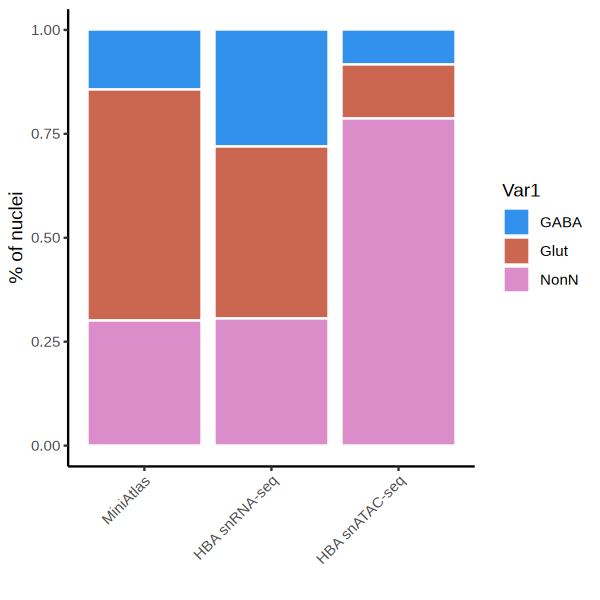

In [120]:
badcol <- c("Doublet", "Low DNA quality", "Unknown")

d1 <- table(lmeta[lmeta$class != "Unknown", ]$class) %>% as.data.frame %>% mutate(dataset = "MiniAtlas")
d2 <- data.frame(Var1 = d1$Var1, Freq = c(45905, 69469, 428700)) %>% mutate(dataset = "HBA snATAC-seq")
d3 <- read.table("../../ref/hba_10XRNA/Siletti_cortex_l1anno_count.xls", sep = "\t", header = T) %>% 
group_by(l1_anno) %>% summarise(Freq = sum(cell_number)) %>% mutate(dataset = "HBA snRNA-seq") %>%
select(l1_anno, Freq,dataset) %>% setNames(c("Var1","Freq","dataset"))

t1 <- do.call(rbind, list(d1, d2, d3)) %>%
mutate(dataset = factor(dataset, levels = c("MiniAtlas", "HBA snRNA-seq", "HBA snATAC-seq"))) %>%
ggplot(aes(x = dataset, y = Freq, fill = Var1)) + 
geom_col(color = "white", position = "fill") + 
scale_fill_manual(values = ccol1) +
theme_classic() + 
ylab("% of nuclei") + xlab("") +
theme(axis.text.x = element_text(angle = 45, hjust = 1))

options(repr.plot.width = 5, repr.plot.height = 5)
t1

In [62]:
### This estimation is coarse. We need to compare the expected versus observed the %Neu
snatac = read.csv('/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_ATAC/hba_merged.metadata.csv', row.names = 1)
neuexpect <- snatac %>%
group_by(Brain.region, cellclass) %>%
summarise(count = n()) %>%
mutate(prop = count / sum(count)) %>%
ungroup() %>%
filter(cellclass == "NonN")

`summarise()` has grouped output by 'Brain.region'. You can override using the `.groups` argument.


`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”


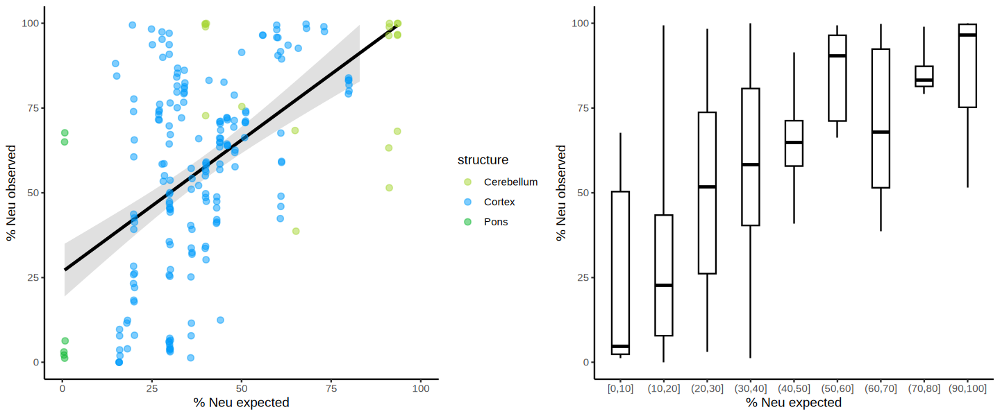

In [103]:
# mmeta <- merge(lmeta, distinct(neun), by = c("rna", "region", "donor", "target")) %>%
# group_by(rna, region, structure, donor, target, ratio, class) %>%
# summarise(count = n()) %>%
# mutate(prop = count / sum(count)) %>%
# ungroup() 

# ### if no mixing ratio, use expected from snATAC
# mmeta[is.na(mmeta$ratio),]$ratio <- 100*(1 - neuexpect[match(mmeta[is.na(mmeta$ratio),]$region, neuexpect$Brain.region),]$prop)


t1 <- mmeta %>% 
filter(class == "NonN") %>%
ggplot(aes(x = as.numeric(ratio), y = 100*(1 - prop), color = structure)) + 
geom_smooth(method = "lm", se = T, color = "black", alpha = 0.3) +
geom_jitter(alpha = 0.5, size = 2) + 
theme_classic() + 
xlim(0, 100) + ylim(0, 100) + 
ylab("% Neu observed") + xlab("% Neu expected") + 
scale_color_manual(values = col1)

t2 <- mmeta %>%
filter(class == "NonN") %>%
mutate(bin = cut(ratio, breaks = seq(0, 100, length.out = 11), include.lowest = TRUE)) %>%
ggplot(aes(x = bin, y = 100*(1 - prop))) + 
geom_boxplot(width = 0.4, fill = "white", color = "black", alpha=0.8, 
             coef = 2, outlier.shape = NA, 
             position = position_dodge(width = 0.9)) + 
theme_classic() + 
ylim(0, 100) + 
ylab("% Neu observed") + xlab("% Neu expected")

options(repr.plot.width = 12, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, rel_widths = c(0.55, 0.45))
fig1

ggsave(fig1, filename = "../Figure/EXTD2_NeuN_enrich_performance_obs_exp_250601.pdf", dpi = 300, height = 5, width = 12)
write.table(mmeta, "../Figure/EXTD2_NeuN_enrich_performance_obs_exp_250601.xls", sep = "\t", quote = F)

## Plot RNA UMAP

In [15]:
### rerun UMAP to include DE genes to variable features
dds <- read.csv("02.RNA/edgeR_250808/subclass_corrected_edgeR.dds", header = T)
dgene <- dds %>% filter(FDR < 0.05) %>%
group_by(celltype) %>%
slice_max(order_by = logFC, n = 200) %>%
ungroup %>% dplyr::select(gene) %>% unlist %>% as.character %>% unique

length(dgene)
intersect(dgene, VariableFeatures(mmg)) %>% length
unique(c(dgene, VariableFeatures(mmg))) %>% length

[1] 3575

[1] 1003

[1] 5572

In [17]:
### Rerun UMAP
k <- 50
VariableFeatures(mmg) <- unique(c(dgene, VariableFeatures(mmg)))
mmg <- ScaleData(mmg)
mmg <- RunPCA(mmg, features = VariableFeatures(object = mmg), npcs = 50, verbose = F)
npc <- significant_pc_test(mmg@reductions$pca@cell.embeddings, min_pc = 15)

library(harmony)
mmg <- RunHarmony(mmg, group.by.vars = "donor", dims.use = 1:npc)
        
reduction <- "harmony"
mmg <- RunUMAP(mmg, seed.use = 131, reduction = reduction, 
        dims = 1:npc, n.neighbors = k, min.dist = 0.1, n.components = 2L, 
        umap.method = "umap-learn")

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”


[1] "Downsample PC matrix to 25000 cells to calculate significant PC components"


Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 37553850)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The depre

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



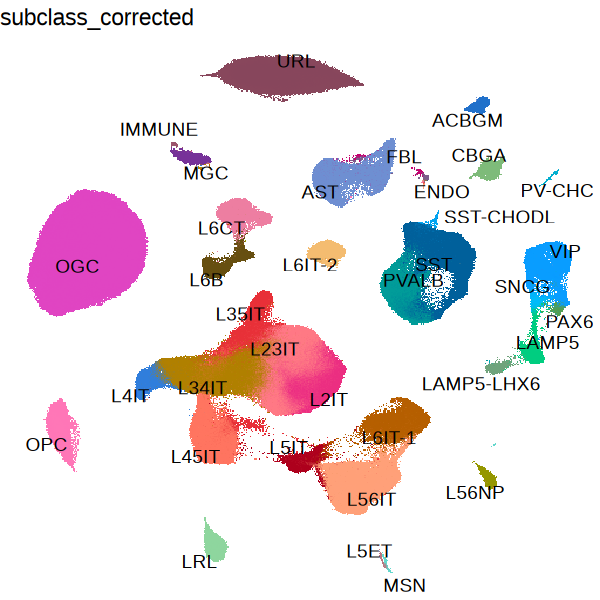

In [23]:
mmg <- RunUMAP(mmg, seed.use = 131, reduction = reduction, 
        dims = 1:npc, n.neighbors = 30, n.components = 2L, 
        umap.method = "umap-learn")

options(repr.plot.width = 5, repr.plot.height = 5)
DimPlot(mmg, group.by = "subclass_corrected", cols = ccol2, label = T, repel = T) & theme_void() + NoLegend()

## Replot DNA UMAP

In [24]:
mtx1 <- ac$obsm$X_spectral_harmony
rownames(mtx1) <- ac$obs$rna_bc
colnames(mtx1) <- paste0("SP", 1:50)
mmg[["k27ac_spectral_harmony"]] <- CreateDimReducObject(embeddings = mtx1, key = "acSPha_")

reduction <- "k27ac_spectral_harmony"
npc <- significant_pc_test(mmg[[reduction]]@cell.embeddings, min_pc = 15)
mmg <- RunUMAP(mmg, seed.use = 131, reduction = reduction, 
        dims = 1:npc, n.neighbors = 30, n.components = 2L, 
        reduction.name = "k27ac_umap_new", umap.method = "umap-learn")

Warning message:
“No assay specified, setting assay as RNA by default.”


[1] "Downsample PC matrix to 25000 cells to calculate significant PC components"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Warning message:
“Removed 411980 rows containing missing values or values outside the scale range (`geom_scattermore()`).”
Warning message:
“annotation$theme is not a valid theme.
Please use `theme()` to construct themes.”


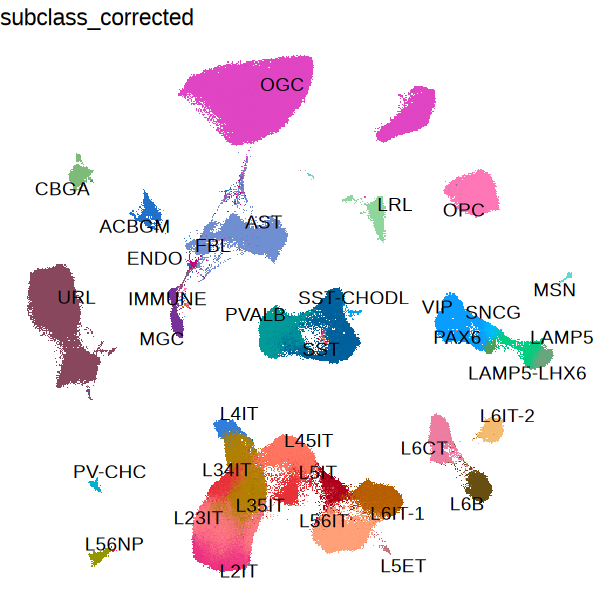

In [25]:
options(repr.plot.width = 5, repr.plot.height = 5)
DimPlot(mmg, group.by = "subclass_corrected", reduction = "k27ac_umap_new", cols = ccol2, label = T, repel = T) & theme_void() + NoLegend()

In [26]:
mtx1 <- me3$obsm$X_spectral_harmony
rownames(mtx1) <- me3$obs$rna_bc
colnames(mtx1) <- paste0("SP", 1:50)
mmg[["k27me3_spectral_harmony"]] <- CreateDimReducObject(embeddings = mtx1, key = "acSPme3_")

reduction <- "k27me3_spectral_harmony"
npc <- significant_pc_test(mmg[[reduction]]@cell.embeddings, min_pc = 15)
mmg <- RunUMAP(mmg, seed.use = 131, reduction = reduction, 
        dims = 1:npc, n.neighbors = 30, n.components = 2L, 
        reduction.name = "k27me3_umap_new", umap.method = "umap-learn")

Warning message:
“No assay specified, setting assay as RNA by default.”


[1] "Downsample PC matrix to 25000 cells to calculate significant PC components"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“Removed 339097 rows containing missing values or values outside the scale range (`geom_scattermore()`).”
Warning message:
“annotation$theme is not a valid theme.
Please use `theme()` to construct themes.”


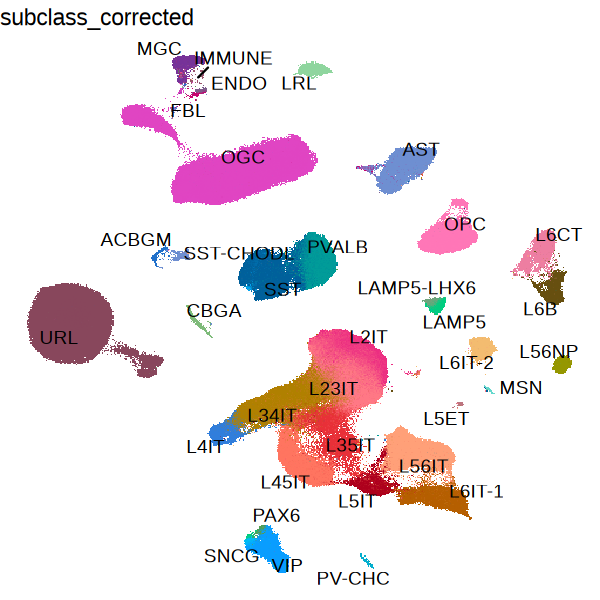

In [28]:
options(repr.plot.width = 5, repr.plot.height = 5)
DimPlot(mmg, group.by = "subclass_corrected", reduction = "k27me3_umap_new", cols = ccol2, label = T, repel = T) & theme_void() + NoLegend()

In [43]:
tmp <- merge(ac$obs, as.data.frame(mmg[["k27ac_umap_new"]]@cell.embeddings), by.x = "rna_bc", by.y = 0) %>% 
tibble::column_to_rownames("rna_bc")
write.table(tmp, "01.DNA/MiniAtlas_H3K27ac_merged_dual_filt_clean_keep_250918_UMAP_cood_new.txt", sep = ",", col.names = T, row.names = T, quote = F) 

tmp <- merge(me3$obs, as.data.frame(mmg[["k27me3_umap_new"]]@cell.embeddings), by.x = "rna_bc", by.y = 0) %>% 
tibble::column_to_rownames("rna_bc")
write.table(tmp, "01.DNA/MiniAtlas_H3K27me3_merged_dual_filt_clean_keep_250918_UMAP_cood_new.txt", sep = ",", col.names = T, row.names = T, quote = F)

## Plot annotation hierachy

### 1. RNA subclass and cluster

In [7]:
mmg$subclass_corrected <- lmeta[colnames(mmg),]$subclass_corrected
unique(mmg$subclass_corrected) %>% length

[1] 35

In [20]:
mmg$cluster_manual_name <- lmeta[colnames(mmg),]$cluster_manual_name
unique(mmg$cluster_manual_name) %>% length

[1] 160

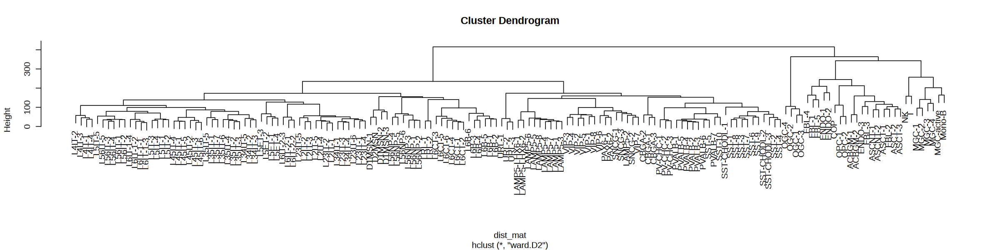

In [41]:
### cell cluster
tmp <- subset(mmg, subset = keep == 1)

cluster_means <- AverageExpression(tmp, features = rownames(tmp), group.by = "cluster_manual_name")$RNA
mat <- t(cluster_means[unique(c(VariableFeatures(mmg),qfeatures)),]) 
median_norm <- sweep(mat, 2, apply(mat, 2, median), FUN = "-")
scaled <- scale(median_norm)
dist_mat <- dist(scaled, method = "euclidean")
hc <- hclust(dist_mat, method = "ward.D2") 

ddo <- as.dendrogram(hc)
data <- dendro_data(ddo, type = "rectangle")
qdf <- segment(data)

corder2 <- rev(data$labels$label)

options(repr.plot.width = 20, repr.plot.height = 5)
plot(hc)

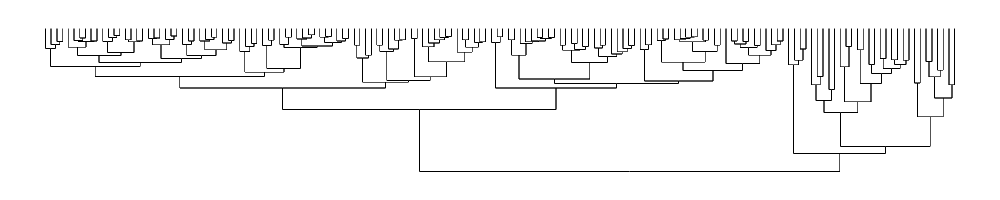

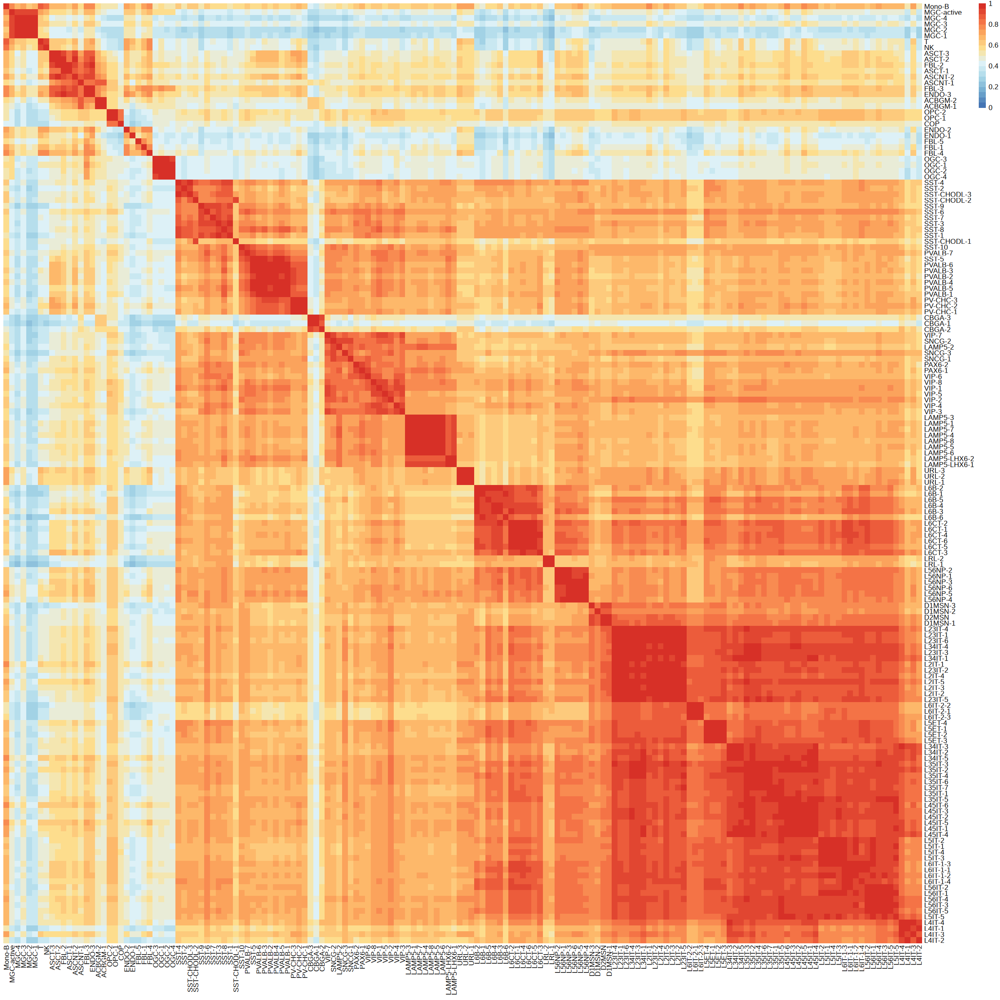

In [49]:
t0 <- ggplot(qdf) + 
geom_segment(aes(x = x, y = y, xend = xend, yend = yend)) + 
# coord_flip() + 
scale_y_reverse(expand = c(0.2, 0)) + theme_void()

options(repr.plot.width = 20, repr.plot.height = 4)
t0

options(repr.plot.width = 20, repr.plot.height = 20)
t1 <- cor(as.matrix(cluster_means), method = "pearson")[corder2, corder2] %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "none", angle_col = 90, breaks = seq(0, 1, 0.05),
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdYlBu"))(20)))

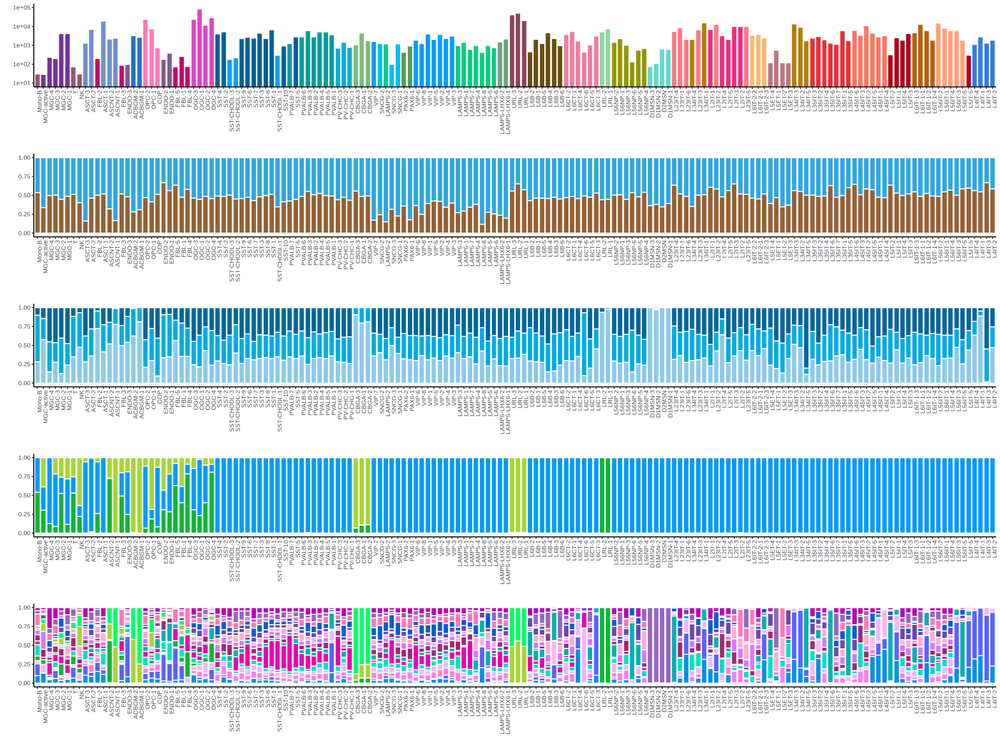

In [134]:
t01 <- table(tmp$cluster_manual_name, tmp$subclass_corrected) %>%
as.data.frame %>% filter(Freq != 0) %>%
mutate(Var1 = factor(Var1, levels = (corder2))) %>%
ggplot(aes(y = Freq, x = Var1, fill = Var2)) + 
geom_bar(stat = "identity", color = "white") +
xlab("") + ylab("") +
scale_y_log10() + 
coord_cartesian(ylim = c(10, 10^5)) + 
theme_classic() + 
scale_fill_manual(values = ccol2) + NoLegend() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

t1 <- table(tmp$target, tmp$cluster_manual_name) %>%
as.data.frame %>% 
mutate(Var2 = factor(Var2, levels = (corder2))) %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup() %>%
ggplot(aes(y = ratio_in_tech, x = Var2, fill = Var1)) + 
geom_col(position = "fill", color = "white") + 
xlab("") + ylab("") +
theme_classic() + scale_fill_manual(values = tcol) + NoLegend() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

t2 <- table(tmp$donor, tmp$cluster_manual_name) %>%
as.data.frame %>% 
mutate(Var2 = factor(Var2, levels = (corder2))) %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup() %>%
ggplot(aes(y = ratio_in_tech, x = Var2, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("") + ylab("") +
theme_classic() + scale_fill_manual(values = dcol) + NoLegend() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

### since we sort different regions with different %NeuN, we split Neu and NonN for calculation
### for each region, whats the cell types proportion?
gmeta <- tmp@meta.data %>% filter(class %in% c("GABA", "Glut"))
d1 <- table(gmeta$region, gmeta$cluster_manual_name) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
d11 <- table(gmeta$structure, gmeta$cluster_manual_name) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
gmeta <- tmp@meta.data %>% filter(class == "NonN")
d2 <- table(gmeta$region, gmeta$cluster_manual_name) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
d22 <- table(gmeta$structure, gmeta$cluster_manual_name) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup() 

t3 <- rbind(d11, d22) %>%
mutate(Var2 = factor(Var2, levels = (corder2))) %>%
ggplot(aes(y = ratio_in_tech, x = Var2, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("") + ylab("") +
theme_classic() + scale_fill_manual(values = col1) + NoLegend() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

t4 <- rbind(d1, d2) %>%
mutate(Var2 = factor(Var2, levels = (corder2))) %>%
ggplot(aes(y = ratio_in_tech, x = Var2, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("") + ylab("") +
theme_classic() + scale_fill_manual(values = col2) + NoLegend() + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

options(repr.plot.width = 20, repr.plot.height = 15)
fig1 <- cowplot::plot_grid(t01, t1, t2, t3, t4, nrow = 5, align = "v")
fig1

### Calculate regional sepcficity score

In [114]:
### note: since we perform neuron enrichment we need to separate Neu and NonN
library(philentropy)

rlist <- list()
for (f in corder){
    fclass <- tmp@meta.data %>% filter(subclass_corrected == f) %>% dplyr::select(class) %>% unique %>% unlist %>% as.character
    dist1 <- tmp@meta.data %>% filter(subclass_corrected == f) %>% dplyr::select(region) %>% table
    dist1 <- (dist1/(sum(dist1))) %>% as.data.frame

    if(fclass == "NonN"){
        dist2 <- tmp@meta.data %>% filter(class == fclass) %>% dplyr::select(region) %>% table
    }else{
        dist2 <- tmp@meta.data %>% filter(class != "NonN") %>% dplyr::select(region) %>% table
    }
    dist2 <- (dist2/(sum(dist2))) %>% as.data.frame
    distdf <- merge(dist1, dist2, by = "region", all = T) %>% tibble::column_to_rownames("region")
    distdf[is.na(distdf)] <- 0
    rlist[[f]] <- suppressMessages(JSD(t(distdf), test.na = T))
}

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


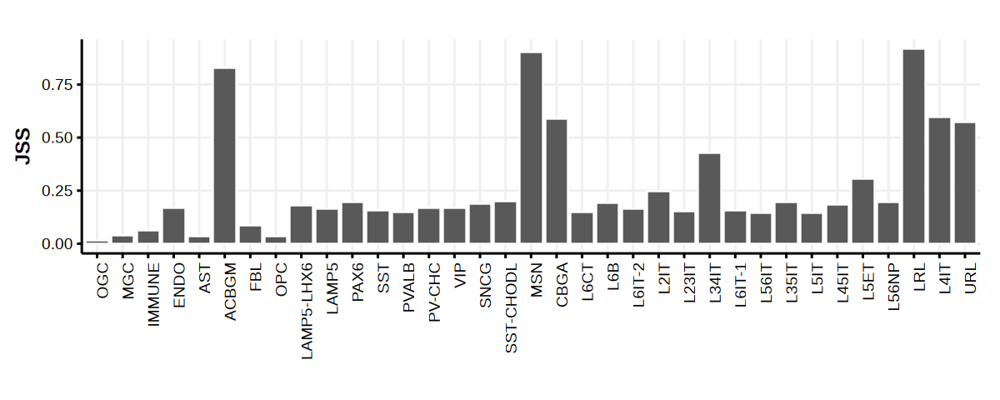

In [115]:
t1 <- as.data.frame(rlist) %>% 
t %>% as.data.frame %>% 
setNames("JSS") %>% 
tibble::rownames_to_column("subclass") %>%
mutate(subclass = gsub("\\.", "-", subclass)) %>%
mutate(subclass = factor(subclass, levels = corder)) %>%
ggplot(aes(x = subclass, y = JSS)) + 
geom_col(color = "white") + 
theme_Publication() + xlab("") + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

options(repr.plot.width = 10, repr.plot.height = 4)
t1

In [123]:
rlist <- list()
for (f in corder2){
    fclass <- tmp@meta.data %>% filter(cluster_manual_name == f) %>% dplyr::select(class) %>% unique %>% unlist %>% as.character
    dist1 <- tmp@meta.data %>% filter(cluster_manual_name == f) %>% dplyr::select(region) %>% table
    dist1 <- (dist1/(sum(dist1))) %>% as.data.frame

    if(fclass == "NonN"){
        dist2 <- tmp@meta.data %>% filter(class == fclass) %>% dplyr::select(region) %>% table
    }else{
        dist2 <- tmp@meta.data %>% filter(class != "NonN") %>% dplyr::select(region) %>% table
    }
    dist2 <- (dist2/(sum(dist2))) %>% as.data.frame
    distdf <- merge(dist1, dist2, by = "region", all = T) %>% tibble::column_to_rownames("region")
    distdf[is.na(distdf)] <- 0
    rlist[[f]] <- suppressMessages(JSD(t(distdf), test.na = T))
}

t2 <- as.data.frame(rlist) %>% 
t %>% as.data.frame %>% 
setNames("JSS") %>% 
tibble::rownames_to_column("cluster") %>%
mutate(cluster = gsub("\\.", "-", cluster)) %>%
mutate(cluster = factor(cluster, levels = corder2)) %>%
ggplot(aes(x = cluster, y = JSS)) + 
geom_col(color = "white") + 
theme_Publication() + xlab("") + ylim(0, 1) + 
theme(axis.text.x = element_text(angle = 90, hjust = 1))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


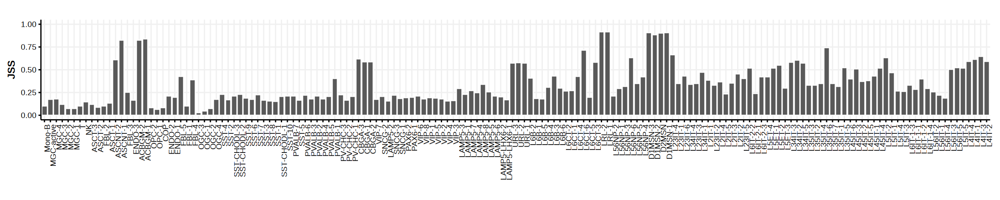

In [124]:
options(repr.plot.width = 20, repr.plot.height = 4)
t2

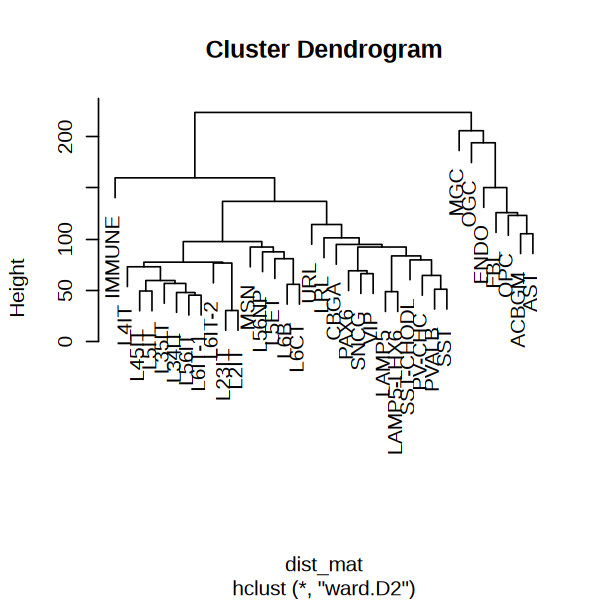

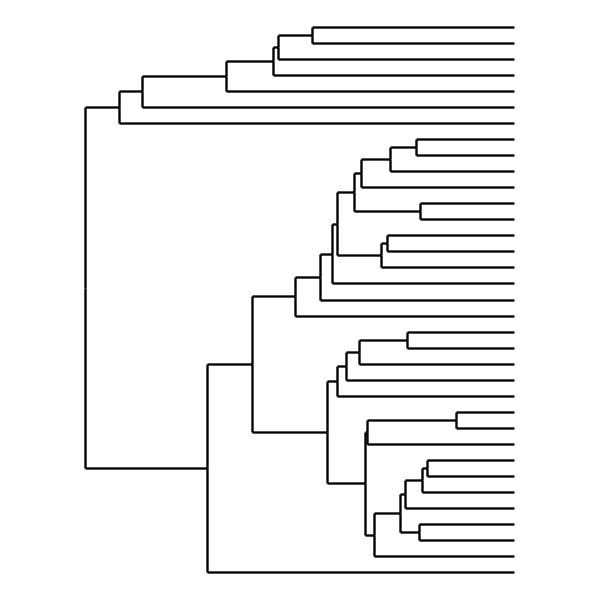

In [57]:
### cell subclass 
cluster_means <- AverageExpression(tmp, group.by = "subclass_corrected")$RNA
mat <- t(cluster_means[c(VariableFeatures(tmp)),])
median_norm <- sweep(mat, 2, apply(mat, 2, median), FUN = "-")
scaled <- scale(median_norm)
dist_mat <- dist(scaled, method = "euclidean")

hc <- hclust(dist_mat, method = "ward.D2") 

ddo <- as.dendrogram(hc)
data <- dendro_data(ddo, type = "rectangle")
qdf <- segment(data)

t0 <- ggplot(qdf) + 
geom_segment(aes(x = x, y = y, xend = xend, yend = yend)) + 
coord_flip() + 
scale_y_reverse(expand = c(0.2, 0)) + theme_void()

options(repr.plot.width = 5, repr.plot.height = 5)
plot(hc)
t0
corder <- rev(data$labels$label)

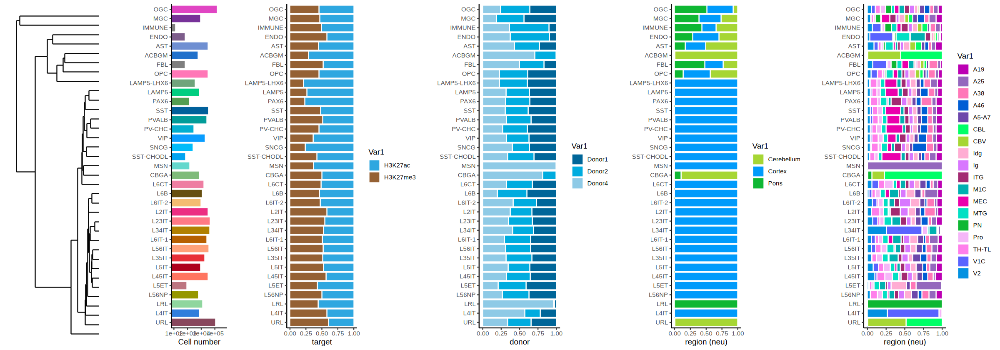

In [193]:
t01 <- table(tmp$subclass_corrected) %>%
as.data.frame %>% 
mutate(Var1 = factor(Var1, levels = rev(corder))) %>%
ggplot(aes(y = Var1, x = Freq, fill = Var1)) + 
geom_bar(stat = "identity", color = "white") +
xlab("Cell number") + ylab("") +
scale_x_log10() + 
coord_cartesian(xlim = c(10^2, 5*10^5)) + 
theme_classic() + 
scale_fill_manual(values = ccol2) + NoLegend()

t1 <- table(tmp$target, tmp$subclass_corrected) %>%
as.data.frame %>% 
mutate(Var2 = factor(Var2, levels = rev(corder))) %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup() %>%
ggplot(aes(y = Var2, x = ratio_in_tech, fill = Var1)) + 
geom_col(position = "fill", color = "white") + 
xlab("target") + ylab("") +
theme_classic() + scale_fill_manual(values = tcol)

t2 <- table(tmp$donor, tmp$subclass_corrected) %>%
as.data.frame %>% 
mutate(Var2 = factor(Var2, levels = rev(corder))) %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup() %>%
ggplot(aes(y = Var2, x = ratio_in_tech, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("donor") + ylab("") +
theme_classic() + scale_fill_manual(values = dcol)

### since we sort different regions with different %NeuN, we split Neu and NonN for calculation
### for each region, whats the cell types proportion?
gmeta <- tmp@meta.data %>% filter(class %in% c("GABA", "Glut"))
d1 <- table(gmeta$region, gmeta$subclass_corrected) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
d11 <- table(gmeta$structure, gmeta$subclass_corrected) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
gmeta <- tmp@meta.data %>% filter(class == "NonN")
d2 <- table(gmeta$region, gmeta$subclass_corrected) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()
d22 <- table(gmeta$structure, gmeta$subclass_corrected) %>% as.data.frame %>%
group_by(Var1) %>% mutate(ratio_in_tech = Freq / sum(Freq)) %>%
ungroup()

t3 <- rbind(d11, d22) %>%
mutate(Var2 = factor(Var2, levels = rev(corder))) %>%
ggplot(aes(y = Var2, x = ratio_in_tech, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("region (neu)") + ylab("") +
theme_classic() + scale_fill_manual(values = col1)

t4 <- rbind(d1, d2) %>%
mutate(Var2 = factor(Var2, levels = rev(corder))) %>%
ggplot(aes(y = Var2, x = ratio_in_tech, fill = Var1)) + 
geom_col(position = "fill", color = "white") + xlab("region (neu)") + ylab("") +
theme_classic() + scale_fill_manual(values = col2)

options(repr.plot.width = 20, repr.plot.height = 7)
fig1 <- cowplot::plot_grid(t0, t01, t1, t2, t3, t4, ncol = 6, rel_widths = c(0.6,0.6,1,1,1,1))
fig1

### 2. Histone subclass

In [365]:
acpm <- read.csv("01.DNA/MiniAtlas_H3K27ac_merged_dual_filt_clean_250722_subclass_corrected.15kb.cpm.csv", header = T, row.names = 1)
mcpm <- read.csv("01.DNA/MiniAtlas_H3K27me3_merged_dual_filt_clean_250722_subclass_corrected.15kb.cpm.csv", header = T, row.names = 1)
colnames(acpm) <- gsub("\\.", "-", colnames(acpm))
colnames(mcpm) <- gsub("\\.", "-", colnames(mcpm))

In [309]:
dobj <- CreateSeuratObject(t(ac$X), meta.data = ac$obs)
VariableFeatures(dobj) <- ac$var_names[ac$var$selected]

dobj[["RNA"]] <- as(dobj[["RNA"]], "Assay")
cluster_means <- AverageExpression(dobj, group.by = "subclass_corrected")$RNA
mat <- t(cluster_means[c(VariableFeatures(dobj)),])
covm <- apply(mat, MARGIN = 2, function(x) sd(x)/mean(x)) 
qvar <- names(covm[which(covm > 1.5)])

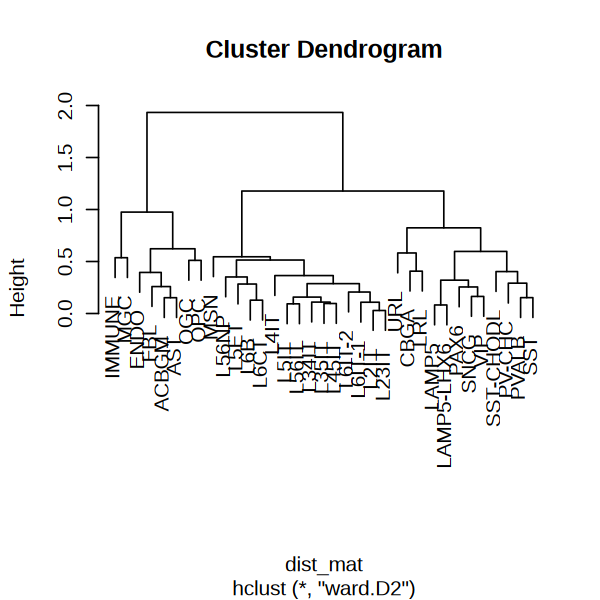

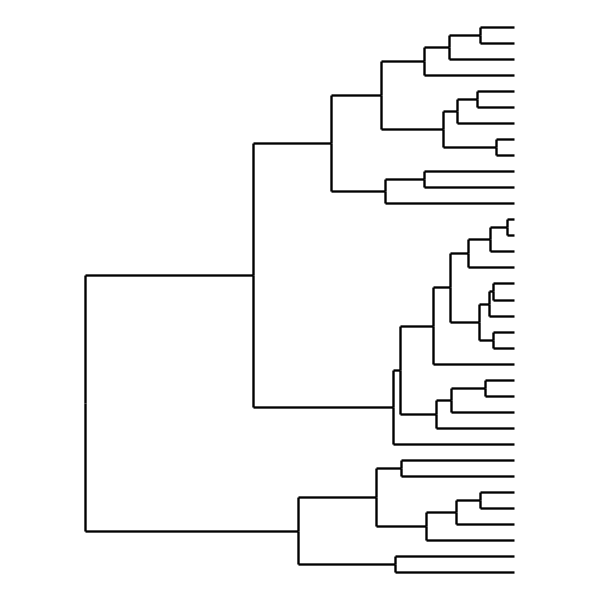

In [369]:
### use cor to calculate dist, as specified in Li 2021 Nature
cor_mat <- cor(as.matrix(acpm[qvar,]), method = "pearson")
dist_mat <- as.dist(1 - cor_mat)

hc <- hclust(dist_mat, method = "ward.D2") 

ddo <- as.dendrogram(hc)
data <- dendro_data(ddo, type = "rectangle")
qdf <- segment(data)

t0 <- ggplot(qdf) + 
geom_segment(aes(x = x, y = y, xend = xend, yend = yend)) + 
coord_flip() + 
scale_y_reverse(expand = c(0.2, 0)) + theme_void()

options(repr.plot.width = 5, repr.plot.height = 5)
plot(hc)
t0

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


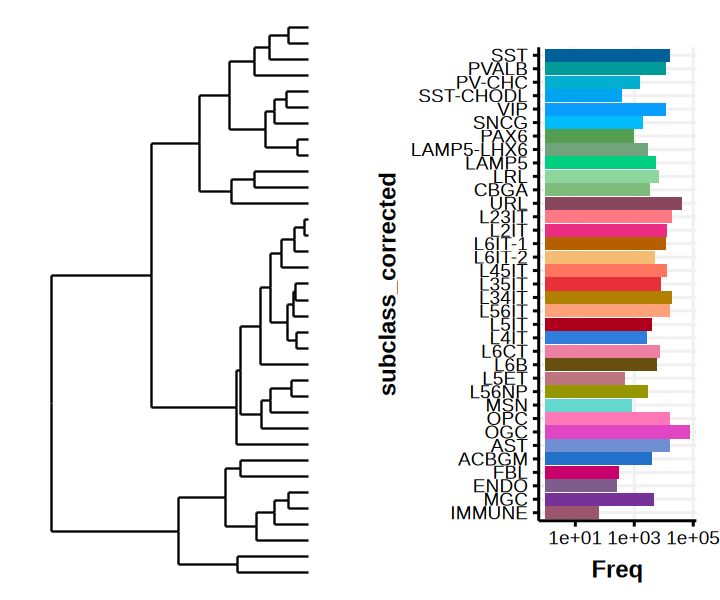

In [374]:
t1 <- ac$obs %>%
dplyr::select(subclass_corrected) %>%
table %>% as.data.frame %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = data$labels$label)) %>%
ggplot(aes(x = Freq, y = subclass_corrected)) + 
geom_col(aes(fill = subclass_corrected)) + 
theme_Publication() + scale_x_log10() + 
scale_fill_manual(values = ccol2) + NoLegend()

fig1 <- cowplot::plot_grid(t0, t1, ncol = 2)

options(repr.plot.width = 6, repr.plot.height = 5)
fig1

Warning message:
“Data is of class dgRMatrix. Coercing to dgCMatrix.”
Warning message:
“No layers found matching search pattern provided”
Warning message:
“No layers found matching search pattern provided”
Warning message:
“No layers found matching search pattern provided”
Warning message:
“Layer ‘data’ is empty”
Warning message:
“No layers found matching search pattern provided”
Warning message:
“No layers found matching search pattern provided”
Warning message:
“Layer ‘scale.data’ is empty”
Warning message:
“Assay RNA changing from Assay5 to Assay”


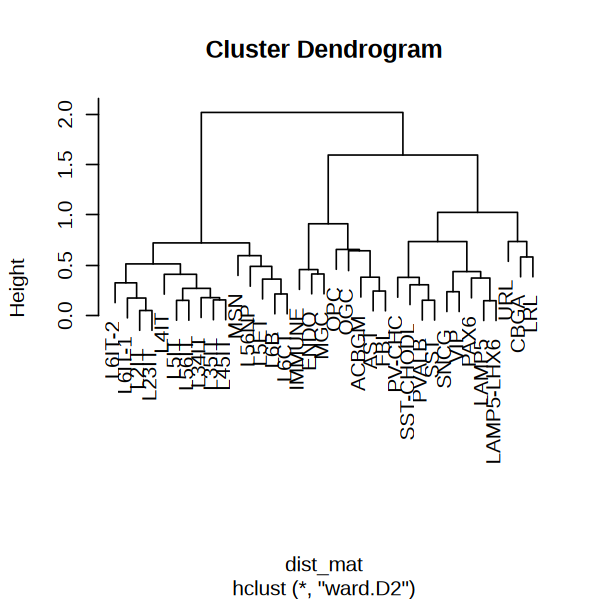

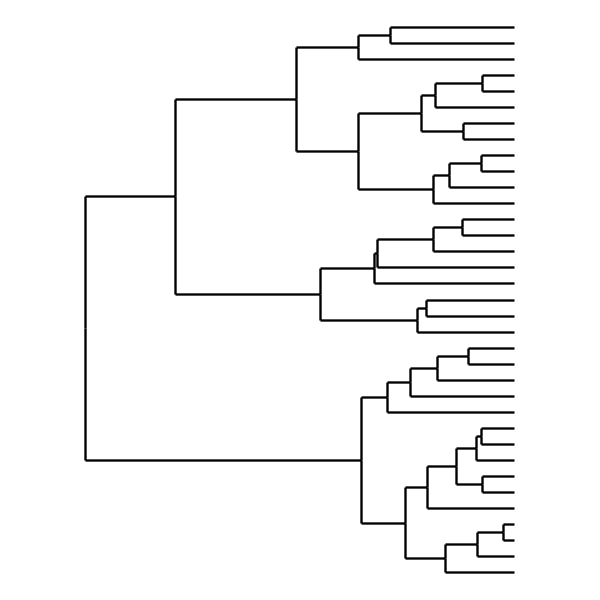

In [378]:
dobj <- CreateSeuratObject(t(me3$X), meta.data = me3$obs)
VariableFeatures(dobj) <- me3$var_names[me3$var$selected]
dobj[["RNA"]] <- as(dobj[["RNA"]], "Assay")
cluster_means <- AverageExpression(dobj, group.by = "subclass_corrected")$RNA
mat <- t(cluster_means[c(VariableFeatures(dobj)),])
covm <- apply(mat, MARGIN = 2, function(x) sd(x)/mean(x)) 
qvar <- names(covm[which(covm > 1.5)])
cor_mat <- cor(as.matrix(mcpm[qvar,]), method = "pearson")
dist_mat <- as.dist(1 - cor_mat)

hc <- hclust(dist_mat, method = "ward.D2") 

ddo <- as.dendrogram(hc)
data <- dendro_data(ddo, type = "rectangle")
qdf <- segment(data)

t0 <- ggplot(qdf) + 
geom_segment(aes(x = x, y = y, xend = xend, yend = yend)) + 
coord_flip() + 
scale_y_reverse(expand = c(0.2, 0)) + theme_void()

options(repr.plot.width = 5, repr.plot.height = 5)
plot(hc)
t0

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


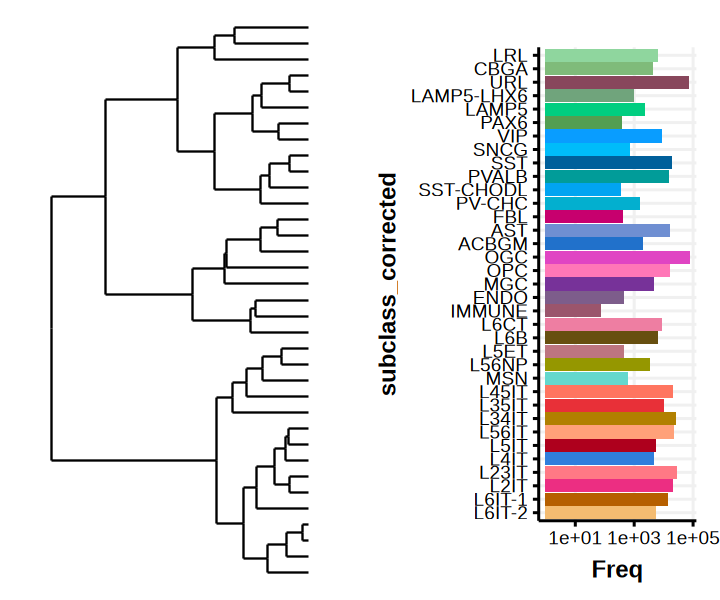

In [380]:
t1 <- me3$obs %>%
dplyr::select(subclass_corrected) %>%
table %>% as.data.frame %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = data$labels$label)) %>%
ggplot(aes(x = Freq, y = subclass_corrected)) + 
geom_col(aes(fill = subclass_corrected)) + 
theme_Publication() + scale_x_log10() + 
scale_fill_manual(values = ccol2) + NoLegend()

fig1 <- cowplot::plot_grid(t0, t1, ncol = 2)

options(repr.plot.width = 6, repr.plot.height = 5)
fig1

### Plot hierachy

In [14]:
tmp@meta.data %>% select(class, supercluster_manual, subclass_corrected, cluster_manual_name) %>% 
distinct %>%
apply(MARGIN = 2, function(x) length(unique(x)))

class supercluster_manual  subclass_corrected cluster_manual_name 
                  3                  19                  35                 160

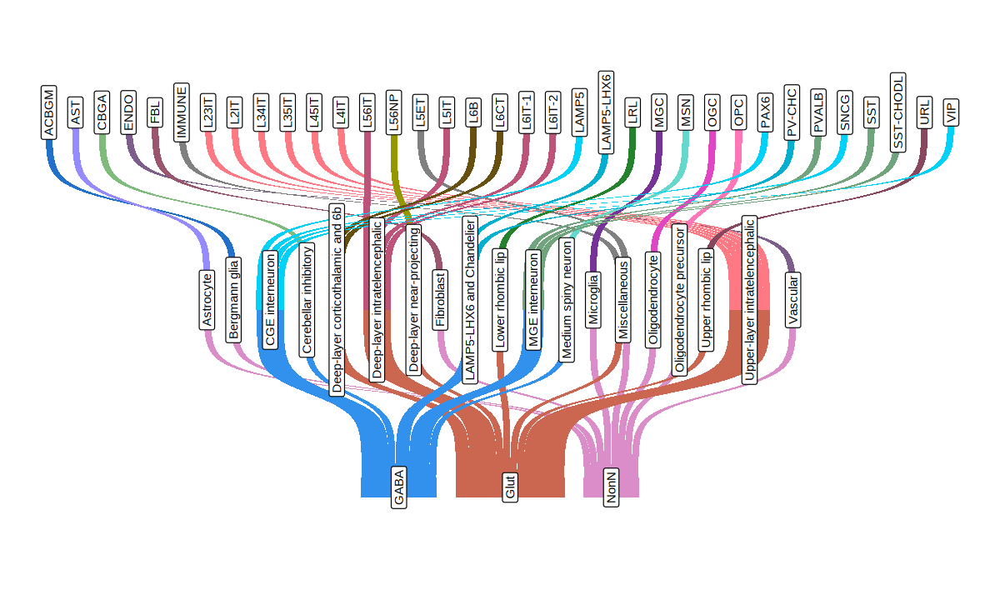

In [17]:
qorder <- tmp@meta.data %>% select(class, supercluster_manual, subclass_corrected) %>% 
distinct %>% 
mutate(class = factor(class, levels = c("NonN", "GABA", "Glut"))) %>% 
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>% 
arrange(class, subclass_corrected) %>%
mutate(class = as.character(class), subclass_corrected = as.character(subclass_corrected))

library(ggsankey)
df_long <- make_long(qorder, class, supercluster_manual, subclass_corrected)

t1 <- ggplot(df_long, aes(x = x, next_x = next_x, 
                    node = node, fill = factor(node), label = node,
                    next_node = next_node)) +
geom_sankey() + 
geom_sankey_label(size = 3, color = "black", fill = "white", angle = 90) +
theme_sankey(base_size = 12) + 
theme_void() + NoLegend() + coord_flip() + 
scale_fill_manual(values = c(ccol1, ccol3, ccol2))

options(repr.plot.width = 10, repr.plot.height = 6)
t1

## Plot marker genes

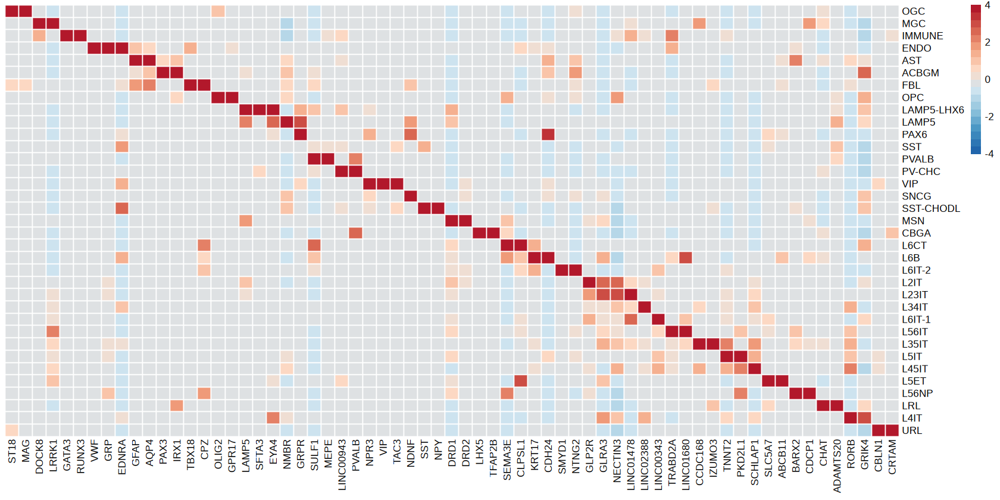

In [348]:
expr <- read.table("02.RNA/MiniAtlas_RNA_merged_dual_filt_clean_250724.subclass.rpkm.txt", row.names = 1, header = T)
colnames(expr) <- gsub("\\.", "-", colnames(expr))

qgene2 <- c("GATA3", "RUNX3", "DOCK8", "LRRK1", "VWF", "TBX18", "GRP", 
  "OLIG2", "GPR17", "GFAP", "AQP4", "PAX3", "IRX1", "LHX5", "TFAP2B", 
  "CHAT", "ADAMTS20", "DRD1", "DRD2", "CPZ", "SEMA3E", "CLPSL1", "KRT17", "CDH24",
  "LINC00343", "GLRA3", "NECTIN3", "GLP2R", "CCDC168", "RORB", "IZUMO3",
  "LINC02388", "SCHLAP1", "GRIK4", "SMYD1", "NTNG2", "TRABD2A", "LINC01680", "LINC01478",
  "TNNT2", "PKD2L1", "BARX2", "CDCP1", "SLC5A7", "ABCB11", "NPR3", "EDNRA", 
  "VIP", "TAC3", "NDNF", "NMBR", "LAMP5", "SFTA3", "LINC00943", "SST", "NPY", 
  "PVALB", "SULF1", "MEPE", "ST18", "MAG", "CBLN1", "CRTAM", "GRPR", "EYA4")

options(repr.plot.width = 14, repr.plot.height = 7)
rmat <- expr[qgene2, corder] 
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ] #[seq(1, length(permutation_vector), by = 2)], ]
t2 <- smat %>% t %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "column", angle_col = 90, breaks = seq(-4, 4, 0.4),
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

ggsave(t2, filename = "../Figure/FIG1_RNA_marker_heatmap_long.pdf", dpi = 300, height = 5, width = 10)
write.table(t(smat), "../Figure/FIG1_RNA_marker_heatmap_long.xls", sep = "\t", quote = F)

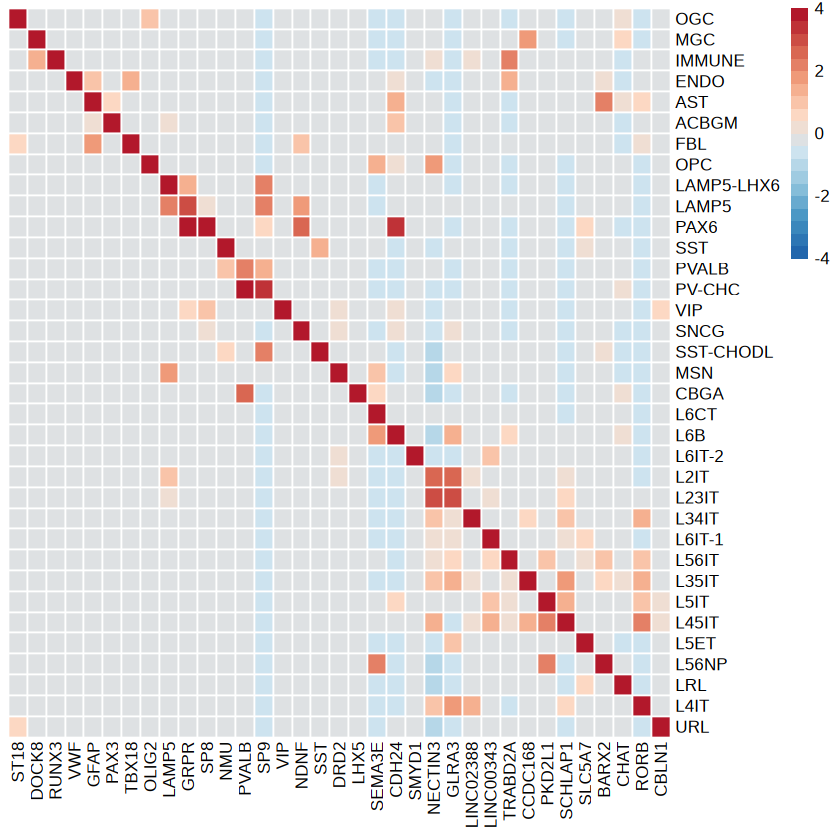

In [349]:
qgene1 <- c('GFAP','PAX3','OLIG2','TBX18','ST18','VWF','DOCK8','RUNX3','CBLN1',
            'LHX5','CHAT','SST','GRPR','PVALB', 'NMU', 'SP8', 'SP9', 'LAMP5','VIP','NDNF', 'SMYD1',
            'CDH24','PKD2L1','SCHLAP1','CCDC168','LINC00343','TRABD2A','SEMA3E','RORB','LINC02388',
            'NECTIN3','GLRA3','SLC5A7','BARX2','DRD2')

options(repr.plot.width = 7, repr.plot.height = 7)
rmat <- expr[qgene1, corder] 
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat <- rmat[permutation_vector, ] #[seq(1, length(permutation_vector), by = 2)], ]
t1 <- smat %>% t %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "column", angle_col = 90, breaks = seq(-4, 4, 0.4),
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

ggsave(t1, filename = "../Figure/FIG1_RNA_marker_heatmap.pdf", dpi = 300, height = 5, width = 5)
write.table(t(smat), "../Figure/FIG1_RNA_marker_heatmap.xls", sep = "\t", quote = F)

In [346]:
### Plot TSS score / gene activity score for two histone modification on the same gene
cpm <- read.table("01.DNA/MiniAtlas_H3K27ac_merged_dual_filt_clean_250722_subclass_tssScore.cpm.txt", header = T, row.names = 1)
rpkm <- read.table("01.DNA/MiniAtlas_H3K27me3_merged_dual_filt_clean_250722_subclass_geneScore.cpm.txt", header = T, row.names = 1)
intersect(rownames(cpm), rownames(smat)) %>% length
intersect(rownames(rpkm), rownames(smat)) %>% length

[1] 35

[1] 35

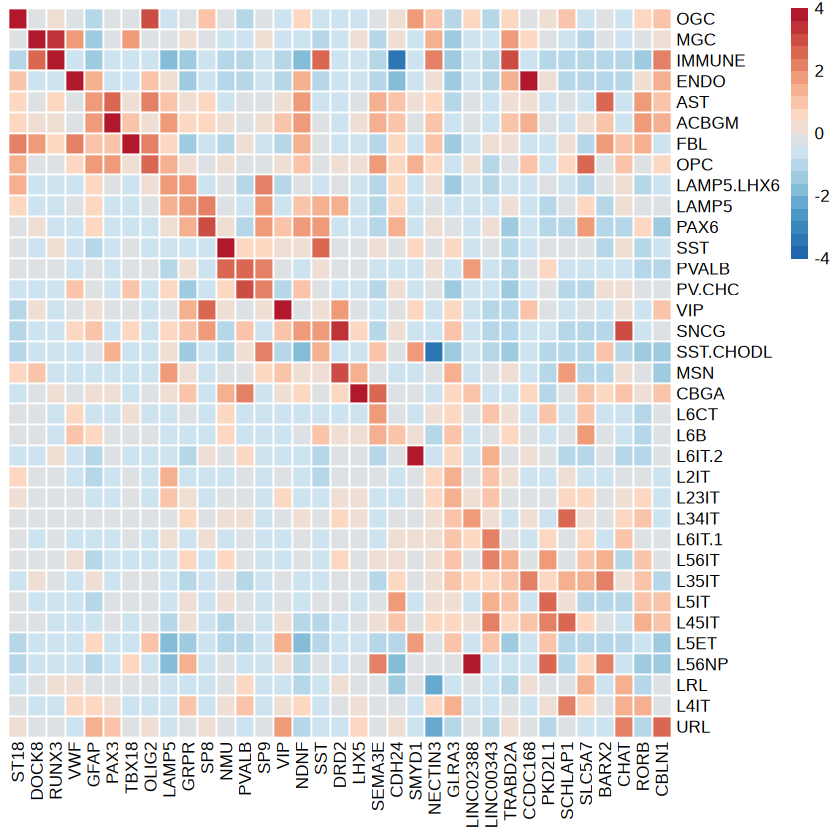

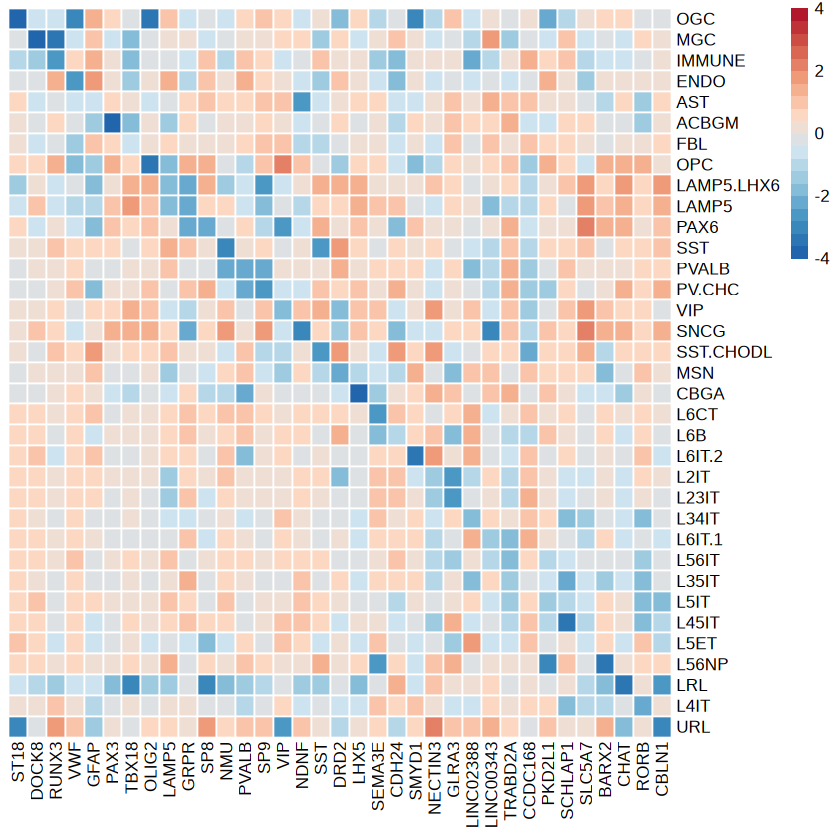

In [350]:
options(repr.plot.width = 7, repr.plot.height = 7)
smat1 <- log2(cpm[rownames(smat), gsub("-", ".", corder)]+1)
t1 <- smat1 %>% t %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "column", angle_col = 90, breaks = seq(-4, 4, 0.4),
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))
smat2 <- log2(rpkm[rownames(smat), gsub("-", ".", corder)] + 1)
t2 <- smat2 %>% t %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "column", angle_col = 90, breaks = seq(-4, 4, 0.4),
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

### Plor marker for cluster

In [352]:
expr <- read.table("02.RNA/MiniAtlas_RNA_merged_dual_filt_clean_250724.cluster_manual_name.rpkm.txt", row.names = 1, header = T, check.names = F)
cpm <- read.table("01.DNA/MiniAtlas_H3K27ac_merged_dual_filt_clean_250722_cluster_manual_name_tssScore.cpm.txt", header = T, row.names = 1, sep = "\t", check.names = F)
rpkm <- read.table("01.DNA/MiniAtlas_H3K27me3_merged_dual_filt_clean_250722_cluster_manual_name_geneScore.cpm.txt", header = T, row.names = 1, sep = "\t", check.names = F)

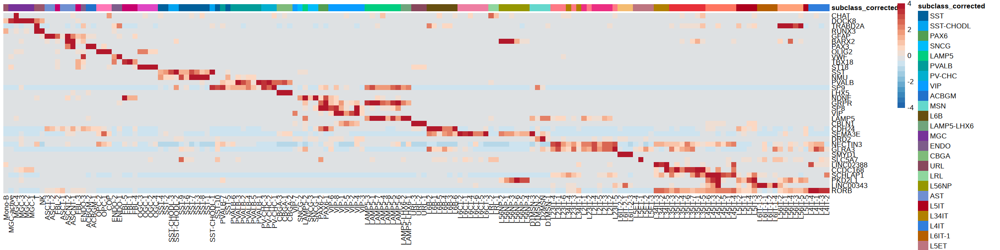

In [354]:
m1 <- lmeta[,c("subclass_corrected", "cluster_manual_name")] %>% distinct
m2 <- as.data.frame(ccol2)
canno <- merge(m1, m2, by.x = "subclass_corrected", by.y = 0) %>%
tibble::column_to_rownames("cluster_manual_name") %>%
dplyr::select(subclass_corrected)

cannocolor <- list(subclass_corrected = ccol2)

qmtx <- expr[qgene1, corder2] 
max_indices <- max.col(qmtx)
permutation_vector <- order(max_indices)

options(repr.plot.width = 20, repr.plot.height = 5)
t1 <- qmtx[permutation_vector, ] %>%  
pheatmap(cluster_rows = F, cluster_cols = F, scale = "row", 
         annotation_col = canno, annotation_colors = cannocolor, 
         angle_col = 90, breaks = seq(-4, 4, 0.4),
         border_color = "white", 
         color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

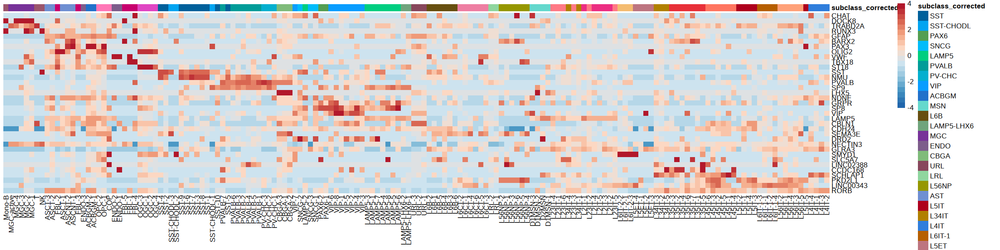

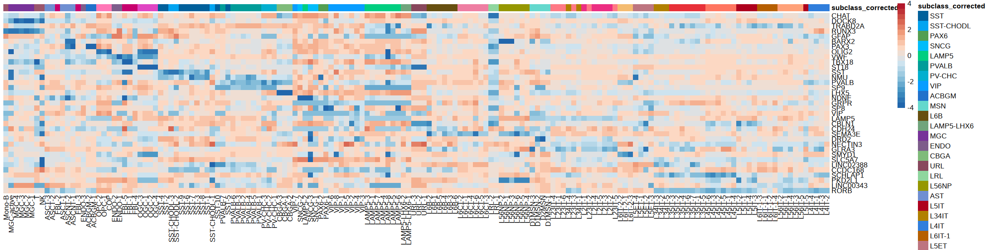

In [358]:
### Plot TSS score / gene activity score for two histone modification on the same gene
smat1 <- log2(cpm[rownames(qmtx[permutation_vector, ]), colnames(qmtx)]+1)
t1 <- smat1 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "row", angle_col = 90, breaks = seq(-4, 4, 0.4),
         annotation_col = canno, annotation_colors = cannocolor, 
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

smat2 <- log2(rpkm[rownames(qmtx[permutation_vector, ]), colnames(qmtx)] + 1)
t2 <- smat2 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, scale = "row", angle_col = 90, breaks = seq(-4, 4, 0.4),
         annotation_col = canno, annotation_colors = cannocolor, 
         border_color = "white", color = rev(colorRampPalette(brewer.pal(n = 8, name = "RdBu"))(20)))

## Plot UMAP: subclass

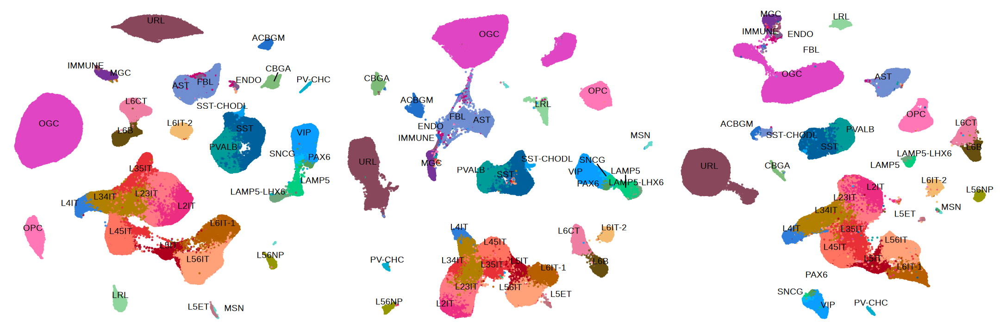

In [56]:
# rumap <- merge(tmp@meta.data, as.data.frame(tmp@reductions$umap@cell.embeddings), by = 0) %>%
# tibble::column_to_rownames('Row.names')

centroids <- rumap %>% 
group_by(subclass_corrected) %>% summarize(umap_1 = mean(umap_1), umap_2 = mean(umap_2))
t1 <- rumap %>%
ggplot(aes(x = umap_1, y = umap_2, color = subclass_corrected)) + 
geom_point(size = 0.3, alpha = 0.8) + 
ggrepel::geom_text_repel(data = centroids, aes(x = umap_1, y = umap_2, label = subclass_corrected), 
                         size = 4, color = "black", vjust = 1.5, hjust = 0.5) +
theme_void() + 
scale_color_manual(values = ccol2) + NoLegend()

centroids <- acumap %>% group_by(subclass_corrected) %>% summarize(umap_1 = mean(k27acumapnew_1), umap_2 = mean(k27acumapnew_2))
t2 <- acumap %>%
ggplot(aes(x = k27acumapnew_1, y = k27acumapnew_2, color = subclass_corrected)) + 
geom_point(size = 0.3, alpha = 0.8) + 
ggrepel::geom_text_repel(data = centroids, aes(x = umap_1, y = umap_2, label = subclass_corrected), 
                         size = 4, color = "black", vjust = 1.5, hjust = 0.5) +
theme_void() + 
scale_color_manual(values = ccol2) + NoLegend()

centroids <- meumap %>% group_by(subclass_corrected) %>% summarize(umap_1 = mean(k27me3umapnew_1), umap_2 = mean(k27me3umapnew_2))
t3 <- meumap %>%
ggplot(aes(x = k27me3umapnew_1, y = k27me3umapnew_2, color = subclass_corrected)) + 
geom_point(size = 0.3, alpha = 0.8) + 
ggrepel::geom_text_repel(data = centroids, aes(x = umap_1, y = umap_2, label = subclass_corrected), 
                         size = 4, color = "black", vjust = 1.5, hjust = 0.5) +
theme_void() + 
scale_color_manual(values = ccol2) + NoLegend()

options(repr.plot.width = 18, repr.plot.height = 6)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

## Plot UMAP: region

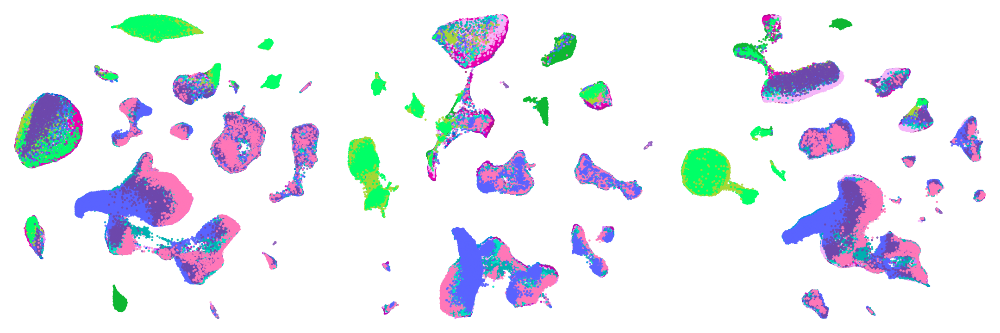

In [65]:
t1 <- rumap %>%
ggplot(aes(x = umap_1, y = umap_2, color = region)) + 
geom_point(size = 0.3, alpha = 0.8) + 
theme_void() + 
scale_color_manual(values = col2) + NoLegend()

t2 <- acumap %>%
ggplot(aes(x = k27acumapnew_1, y = k27acumapnew_2, color = region)) + 
geom_point(size = 0.3, alpha = 0.8) + 
theme_void() + 
scale_color_manual(values = col2) + NoLegend()

t3 <- meumap %>%
ggplot(aes(x = k27me3umapnew_1, y = k27me3umapnew_2, color = region)) + 
geom_point(size = 0.3, alpha = 0.8) + 
theme_void() + 
scale_color_manual(values = col2) + NoLegend()

options(repr.plot.width = 18, repr.plot.height = 6)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

ggsave(fig1, filename = "../Figure/FIG1_allcells_UMAP_region_250918.png", dpi = 300, height = 6, width = 18)

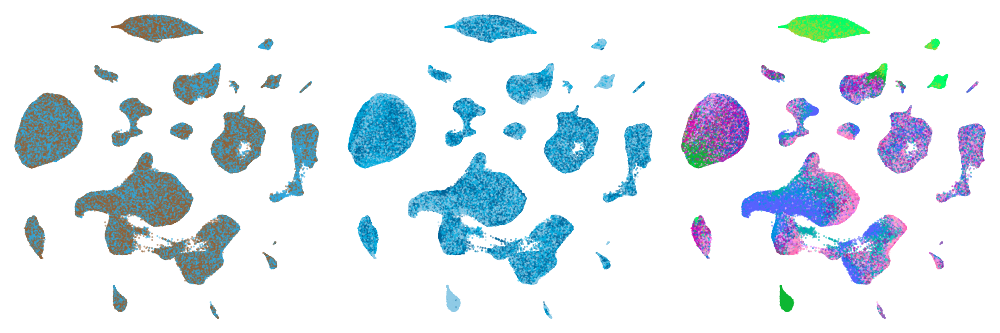

In [77]:
shuffled_umap_df <- rumap[sample(1:nrow(rumap)), ]

t1 <- shuffled_umap_df %>%
ggplot(aes(x = umap_1, y = umap_2, color = target)) + 
geom_point(size = 0.2, alpha = 0.4) + 
theme_void() + 
scale_color_manual(values = tcol) + NoLegend()

t2 <- shuffled_umap_df %>%
ggplot(aes(x = umap_1, y = umap_2, color = donor)) + 
geom_point(size = 0.2, alpha = 0.4) + 
theme_void() + 
scale_color_manual(values = dcol) + NoLegend()

t3 <- rumap %>%
ggplot(aes(x = umap_1, y = umap_2, color = region)) + 
geom_point(size = 0.2, alpha = 0.4) + 
theme_void() + 
scale_color_manual(values = col2) + NoLegend()

options(repr.plot.width = 18, repr.plot.height = 6)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

ggsave(fig1, filename = "../Figure/FIG1_allcells_RNA_UMAP_target_donor_250918.png", dpi = 300, height = 6, width = 18)

## Plot subclass level QC

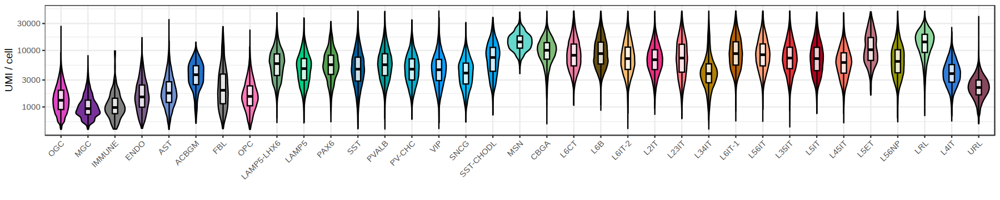

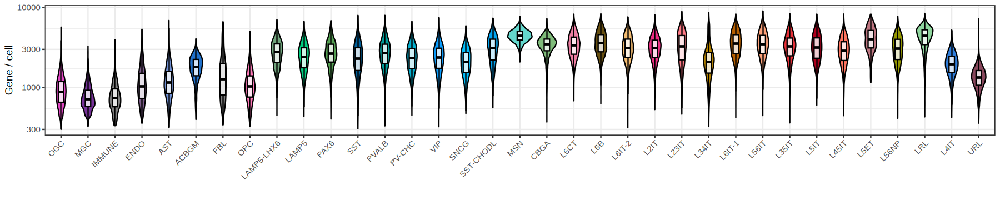

In [200]:
options(repr.plot.width = 15, repr.plot.height = 3)

t1 <- tmp@meta.data %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = nCount_RNA)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(width=0.2, color="black", alpha=0.8, coef = 2, outlier.shape = NA, fill = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
ylab("UMI / cell") + xlab("") + scale_y_log10() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t2 <- tmp@meta.data %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = nFeature_RNA)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(width=0.2, color="black", alpha=0.8, coef = 2, outlier.shape = NA, fill = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
ylab("Gene / cell") + xlab("") + scale_y_log10() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t1
t2

## Plot fragments by subclass

Warning message:
“Duplicated aesthetics after name standardisation: colour”
Warning message:
“Duplicated aesthetics after name standardisation: colour”


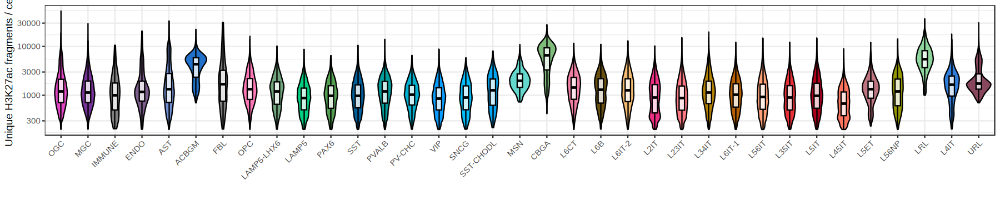

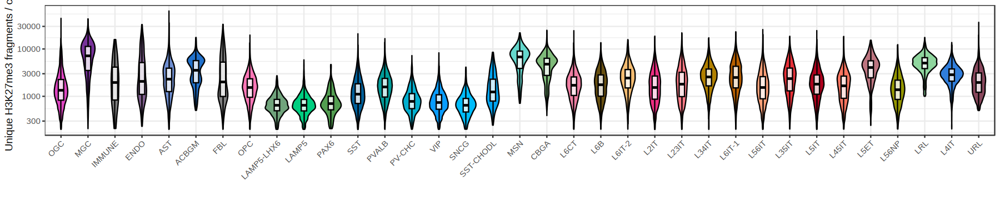

In [207]:
### DNA UMAP
options(repr.plot.width = 15, repr.plot.height = 3)

t1 <- acumap %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = n_fragment)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(width=0.2, color="black", alpha=0.8, coef = 2, outlier.shape = NA, color = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
ylab("Unique H3K27ac fragments / cell") + xlab("") + scale_y_log10() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t2 <- meumap %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = n_fragment)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(width=0.2, color="black", alpha=0.8, coef = 2, outlier.shape = NA, color = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
ylab("Unique H3K27me3 fragments / cell") + xlab("") + scale_y_log10() + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t1
t2

## Plot FRiP by subclass

In [202]:
file <- list()
i = 1
for (f in list.files("../02.sample_QC/PF_cells/DNA_PF/", pattern = ".*_PF_cells.txt$")){
    fname <- gsub("([^_]+)_.*", "\\1", f)
    file[[i]] <- read.table(paste0("../02.sample_QC/PF_cells/DNA_PF/", f), header = F) %>% mutate(lib = fname) %>%
    select(V1, V3, V5, lib) %>% setNames(c("bc", "counts_unique", "unique_in_peaks", "lib")) %>%
    mutate(barcode = paste0(lib, ":", bc))
    i = i + 1
}
file <- do.call(rbind, file)

file <- file %>% filter(barcode %in% paste0(tmp$dna, ":", tmp$atac_bc))
dim(file)

[1] 751077      5

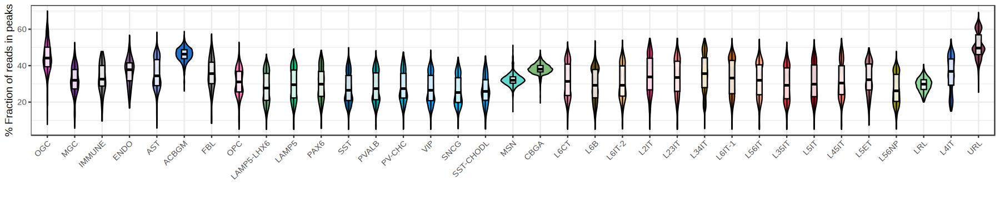

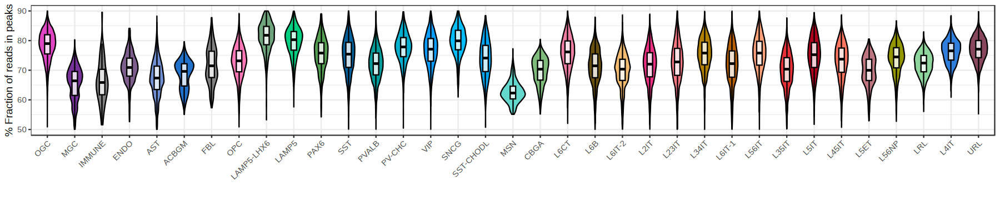

In [210]:
options(repr.plot.width = 15, repr.plot.height = 3)

t1 <- merge(acumap, file, by.x = 0, by.y = "barcode") %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = 100*unique_in_peaks/counts_unique)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(aes(fill = subclass_corrected), width=0.2, color="black", 
             alpha=0.8, coef = 2, outlier.shape = NA, fill = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
# scale_y_continuous(breaks = seq(0, 100, by = 10), limits = c(0, 100)) + 
ylab("% Fraction of reads in peaks") + xlab("") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t2 <- merge(meumap, file, by.x = 0, by.y = "barcode") %>%
mutate(subclass_corrected = factor(subclass_corrected, levels = corder)) %>%
ggplot(aes(x = subclass_corrected, y = 100*unique_in_peaks/counts_unique)) + 
geom_violin(aes(fill = subclass_corrected), color = "black") + 
geom_boxplot(aes(fill = subclass_corrected), width=0.2, color="black", 
             alpha=0.8, coef = 2, outlier.shape = NA, fill = "white") + 
theme_bw() + scale_fill_manual(values = ccol2) + 
# scale_y_continuous(breaks = seq(0, 100, by = 10), limits = c(0, 100)) + 
ylab("% Fraction of reads in peaks") + xlab("") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) + NoLegend()

t1
t2

## Plot RNA integration results

In [259]:
### For RNA: three datasets integraiton
int <- qs::qread("../06.integration/stenRNA_miniatlas_smartseq_cluster_manual_250722.int.qs")

In [252]:
smat1 <- read.table("../06.integration/miniatlas_smartseq_cluster_manual_ovlp_score.txt", sep = "\t", header = T, row.names = 1)
smat2 <- read.table("../06.integration/miniatlas_siletti_cluster_manual_ovlp_score.txt", sep = "\t", header = T, row.names = 1)

smeta <- read.csv("../../ref/Siletti_marker_all.csv")
colnames(smat2) <- smeta[match(gsub("X", "", colnames(smat2)), smeta$Cluster.ID),]$Cluster.name

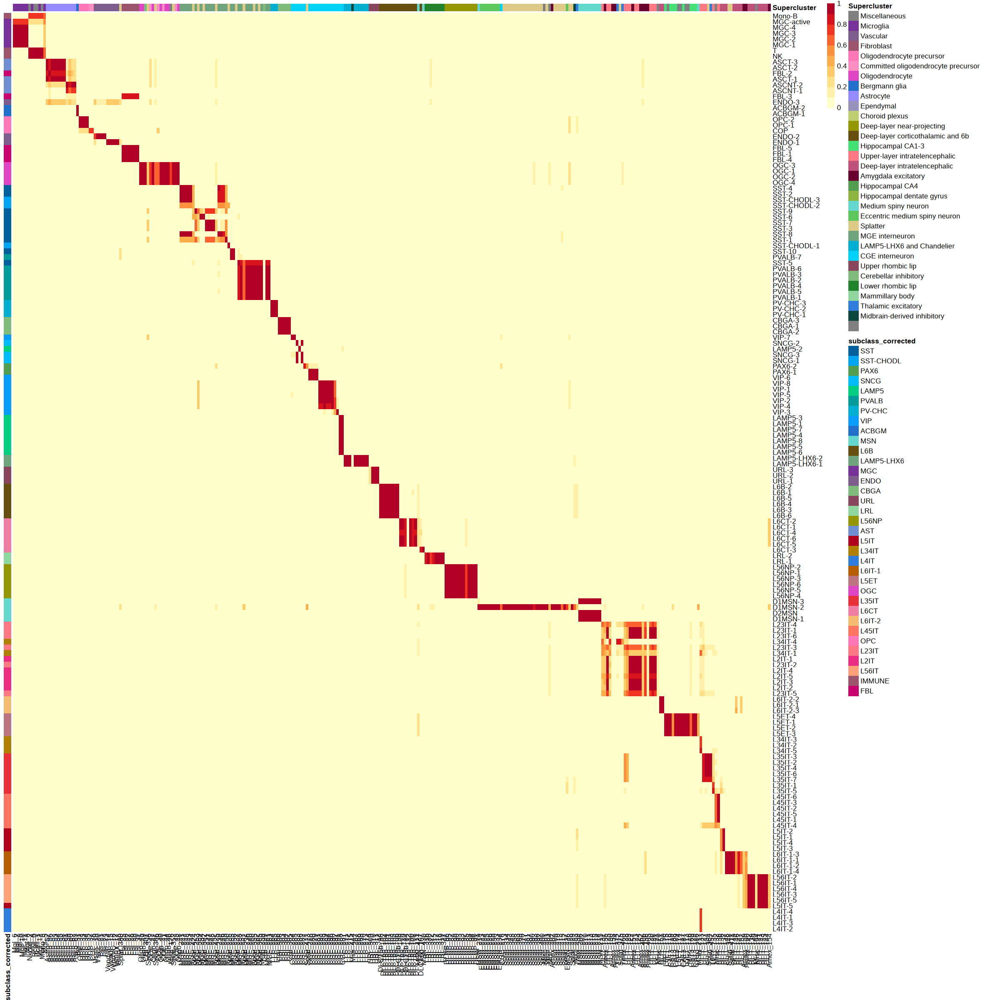

In [288]:
m1 <- lmeta[,c("subclass_corrected", "cluster_manual_name")] %>% distinct
m2 <- as.data.frame(ccol2)
ranno <- merge(m1, m2, by.x = "subclass_corrected", by.y = 0) %>%
tibble::column_to_rownames("cluster_manual_name")

canno <- smeta[,c("Supercluster", "Cluster.name")] %>% 
tibble::column_to_rownames("Cluster.name")
bcol <- c("#808080", '#773299', '#7d5d8b', '#9b556c', '#ff77b7', '#fa8ec1', '#e045c3', '#2171cb', '#968aff', '#9793bd',
'#c0ce72', '#959700', '#674f10', '#46e176', '#ff7985', '#bd5378', '#69012f', '#539e51', '#8fb541', '#64d8cd',
'#5dc75d', '#deca87', '#70a47c', '#03afcf', '#00d1f9', '#88475c', '#7fbb7a', '#23832c', '#8fd69e','#307edc',
'#0c473e', "#808080")
names(bcol) <- unique(canno$Supercluster)
# write.table(as.data.frame(bcol), "../Figure/superterm.color", sep = "\t", quote = F, row.names = T, col.names = T)

rannocolor <- list(subclass_corrected = ccol2),
                   Supercluster = bcol)

options(repr.plot.width = 20, repr.plot.height = 20)
p1 <- smat2 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, border_color = "white", angle_col = 90, 
         annotation_colors = rannocolor, 
         annotation_row = ranno[,1,drop = F], annotation_col = canno,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(10))

In [254]:
ggsave(p1, filename = "../Figure/EXTD4_RNA_int_Siletti_cluster_ovlp_score.pdf", dpi = 300, height = 20, width = 20)
write.table(smat2, "../Figure/EXTD4_RNA_int_Siletti_cluster_ovlp_score.txt", 
            sep = "\t", row.names = T, col.names = T, quote = F)

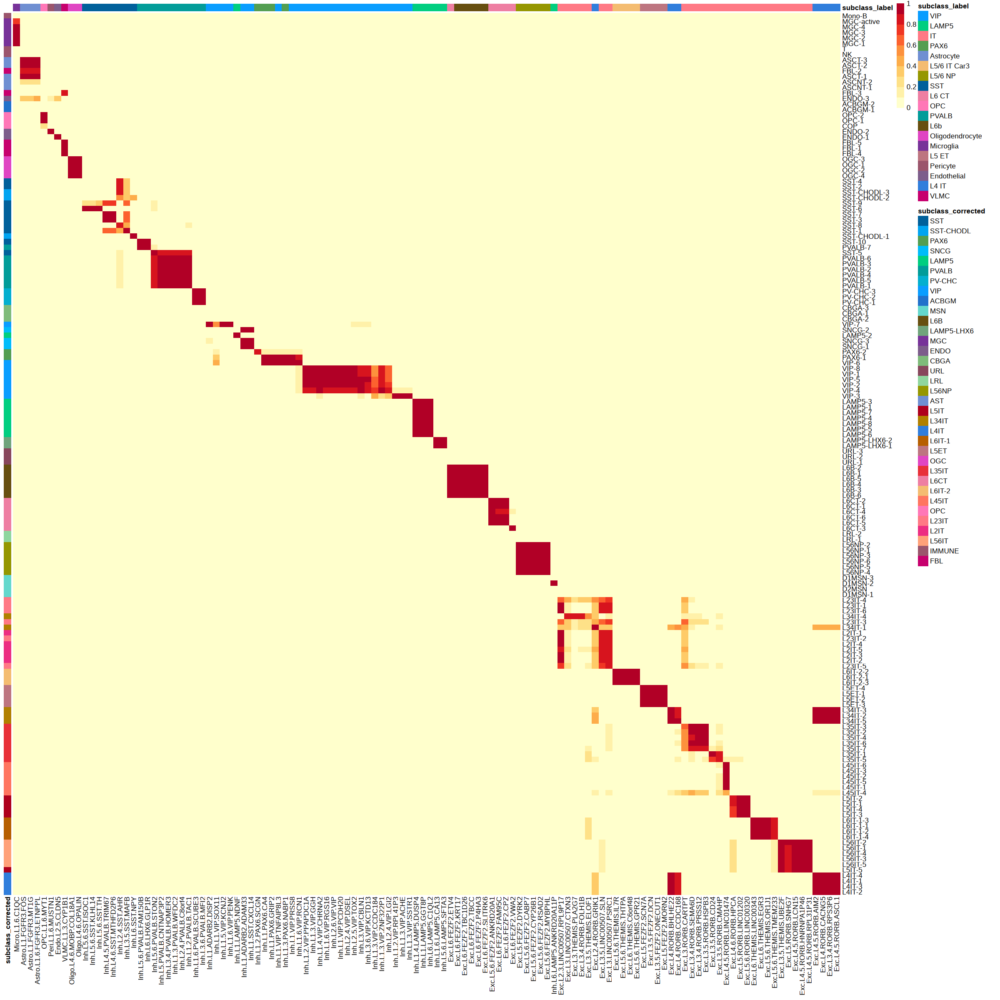

In [305]:
canno <- int@meta.data[int$orig.ident == "SMARTseq",][,c("subclass_label", "cluster_label")] %>% 
distinct %>% tibble::remove_rownames() %>%
tibble::column_to_rownames("cluster_label")
rownames(canno) <- gsub(" ", "\\.", rownames(canno))
rownames(canno) <- gsub("-", "\\.", rownames(canno))

acol <- c("#099dff", "#00ce80", "#ff7985", "#539e51", '#6f8fd2', '#f4bc71', '#959700', '#00609b', 
          '#ee7ea2', "#ff77b7", "#019c99", "#674f10", "#e045c3", "#773299", "#bd7580", "#9b556c", 
          "#7d5d8b", "#307edc", '#c7006e')
names(acol) <- unique(int@meta.data[int$orig.ident == "SMARTseq",]$subclass_label)
# write.table(as.data.frame(acol), "../Figure/SMARTseq_subclass.color", sep = "\t", quote = F, row.names = T, col.names = T)

rannocolor <- list(subclass_corrected = ccol2,
                   subclass_label = acol)

options(repr.plot.width = 20, repr.plot.height = 20)
p1 <- smat1 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, border_color = "white", angle_col = 90, 
         annotation_colors = rannocolor, 
         annotation_row = ranno[,1,drop = F], annotation_col = canno,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(10))

In [306]:
ggsave(p1, filename = "../Figure/EXTD4_RNA_int_SMARTseq_cluster_ovlp_score.pdf", dpi = 300, height = 20, width = 20)
write.table(smat1, "../Figure/EXTD4_RNA_int_SMARTseq_cluster_ovlp_score.txt", 
            sep = "\t", row.names = T, col.names = T, quote = F)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



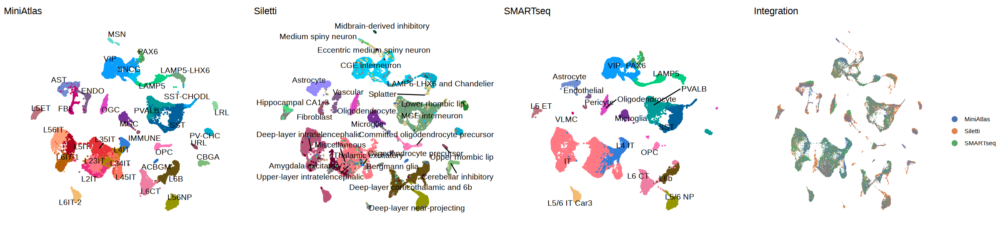

In [282]:
t1 <- DimPlot(int, cols = ccol2, group.by = "subclass_corrected", 
              cells = rownames(int@meta.data[int$orig.ident == "MiniAtlas",]),
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('MiniAtlas') + xlim(-20, 20) + ylim(-20, 20) 
t2 <- DimPlot(int, cols = bcol, group.by = "supercluster_term", 
              cells = rownames(int@meta.data[int$orig.ident == "Siletti",]),
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('Siletti') + xlim(-20, 20) + ylim(-20, 20) 
t3 <- DimPlot(int, cols = acol, group.by = "subclass_label", 
              cells = rownames(int@meta.data[int$orig.ident == "SMARTseq",]),
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('SMARTseq') + xlim(-20, 20) + ylim(-20, 20) 
t4 <- DimPlot(int, group.by = "orig.ident", cols = c("#4C72B0", "#DD8452", "#55A868"), 
              label = F, repel = T) + theme_void() + ggtitle('Integration') + xlim(-20, 20) + ylim(-20, 20) 

options(repr.plot.width = 20, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, t3, t4, ncol = 4)
fig1

## Plot integration for snATAC and DPT RNA

In [430]:
ref1 <- qs::qread('../06.integration/snATAC_DPT_RNA_250722.int.neu.qs')
ref2 <- qs::qread('../06.integration/snATAC_DPT_RNA_250722.int.nonn.qs')

In [431]:
cols <- read.csv("../../ref/yel_Science2023_supp/subclass_celltype_match.csv")
cols$Cell.subclass <- gsub("IT-", "IT", cols$Cell.subclass)
cols$Cell.subclass <- gsub("-", "_", cols$Cell.subclass)
cols$Cell.subclass <- gsub("/", "", cols$Cell.subclass)
cols$Cell.subclass <- gsub("LAMP5_1", "LAMP5", cols$Cell.subclass)
cols$Cell.subclass <- gsub("LAMP5_2", "LAMP5_LHX6", cols$Cell.subclass)
cols$Cell.subclass <- gsub("L56 NP", "NP", cols$Cell.subclass)
cols$Cell.subclass <- gsub("L5 ET", "ET", cols$Cell.subclass)
cols$Cell.subclass <- gsub("L6 CT", "CT", cols$Cell.subclass)
cols$Cell.subclass <- gsub("SUB", "CTXGA", cols$Cell.subclass)

df <- unique(ref1@meta.data[ref1$orig.ident == "snATAC", ]$subclass)
setdiff(df, unique(cols$Cell.subclass))

character(0)

Using ovlpScore as value column: use value.var to override.



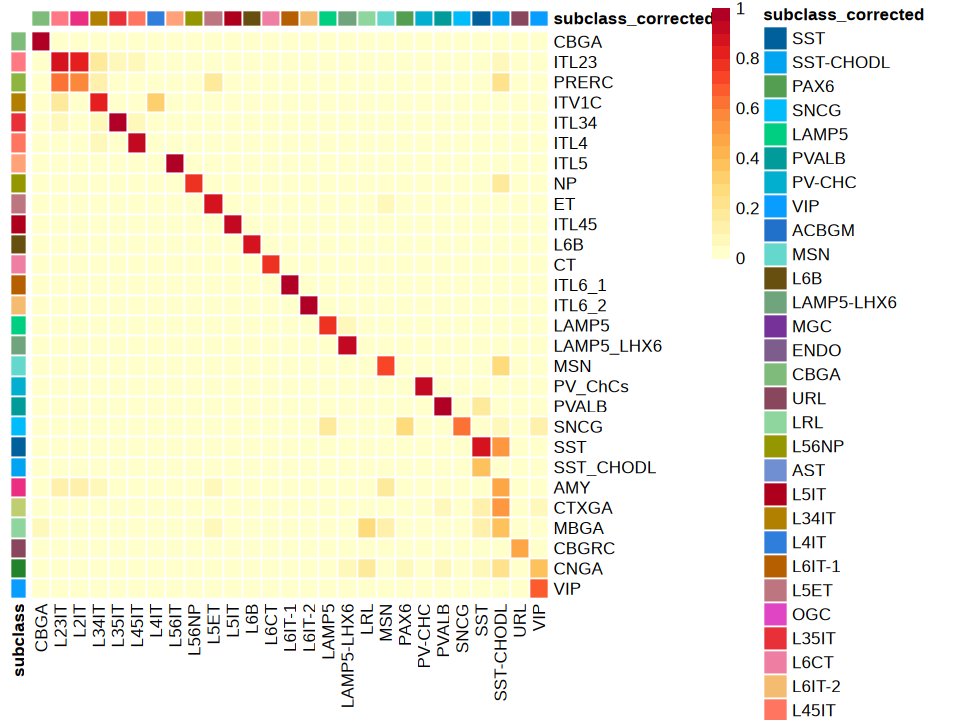

In [432]:
### neu
ranno <- as.data.frame(names(ccol2)) %>% setNames("subclass_corrected")
rownames(ranno) <- ranno[,1]

canno <- cols %>% filter(Cell.subclass %in% df) %>%
select(Cell.subclass, Cell.subclass.color) %>%
distinct %>% tibble::column_to_rownames("Cell.subclass")

bcol <- canno$Cell.subclass.color
names(bcol) <- rownames(canno)
canno$subclass <- rownames(canno)

rannocolor <- list(subclass_corrected = ccol2,
                   subclass = bcol)

t1 <- ref1@meta.data[ref1$orig.ident == "MiniAtlas", c("seurat_clusters", "subclass_corrected")]
t2 <- ref1@meta.data[ref1$orig.ident == "snATAC", c("seurat_clusters", "subclass")] %>% 
filter(subclass %in% names(which(table(ref1$subclass) > 20)))
ovlp_score <- cal_ovlpScore(t1, t2)

rmat <- ovlp_score %>%
reshape2::dcast(anno1 ~ anno2) %>%
tibble::column_to_rownames("anno1") %>% t

ctk <- which(apply(rmat, 1, max) > 0.05)
rmat <- rmat[ctk, ]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat1 <- rmat[permutation_vector, ]
 
options(repr.plot.width = 8, repr.plot.height = 6)
p1 <- smat1 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(0, 1, 0.05),
         border_color = "white", angle_col = 90,
         annotation_colors = rannocolor, 
         annotation_col = ranno, annotation_row = canno[,2,drop=F],
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(20))

Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


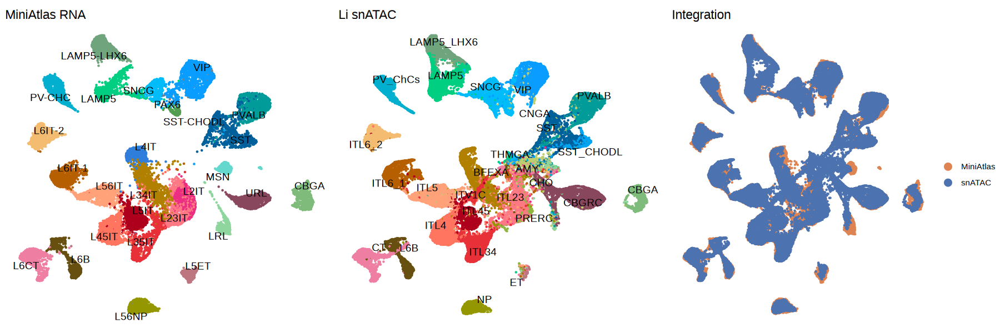

In [433]:
t1 <- DimPlot(ref1, cols = ccol2, group.by = "subclass_corrected", 
              cells = rownames(ref1@meta.data[ref1$orig.ident == "MiniAtlas", ]), 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('MiniAtlas RNA')
t2 <- DimPlot(ref1, cols = bcol, group.by = "subclass", 
              cells = rownames(ref1@meta.data[ref1$orig.ident == "snATAC", ]), 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('Li snATAC')
t3 <- DimPlot(ref1, group.by = "orig.ident", cols = c("#dd8452", "#4c72b0"), label = F, repel = T) + theme_void() + ggtitle('Integration')

options(repr.plot.width = 15, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

Using ovlpScore as value column: use value.var to override.



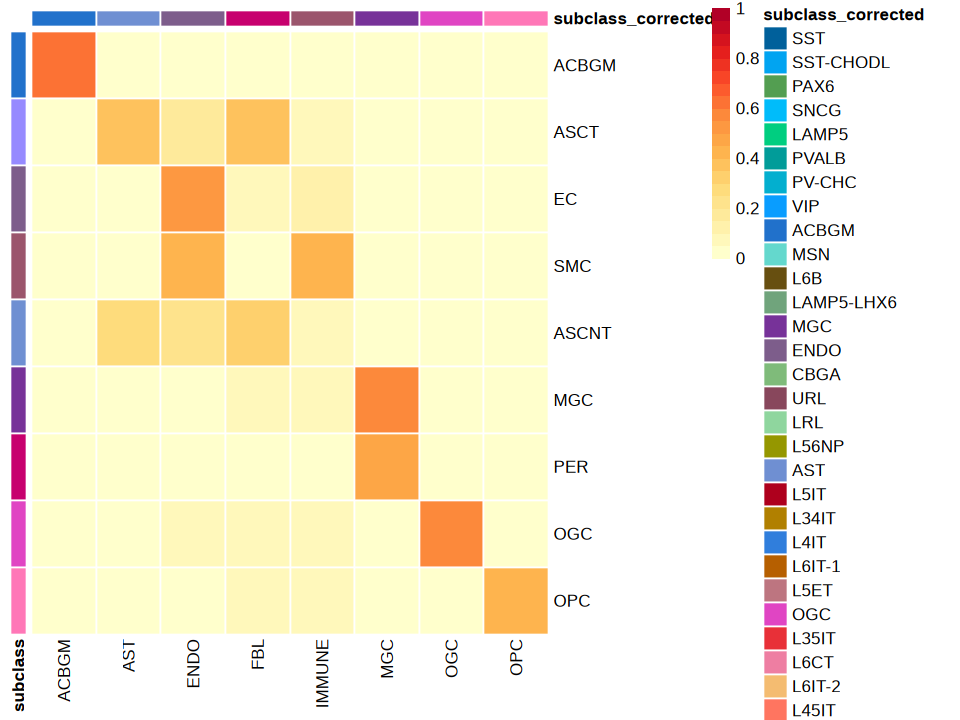

In [439]:
### Non Neurons
df <- unique(ref2@meta.data[ref2$orig.ident == "snATAC", ]$subclass)
canno <- cols %>% filter(Cell.subclass %in% df) %>%
select(Cell.subclass, Cell.subclass.color) %>%
distinct %>% tibble::column_to_rownames("Cell.subclass")
bcol <- canno$Cell.subclass.color
names(bcol) <- rownames(canno)
canno$subclass <- rownames(canno)

rannocolor <- list(subclass_corrected = ccol2,
                   subclass = bcol)

t1 <- ref2@meta.data[ref2$orig.ident == "MiniAtlas", c("seurat_clusters", "subclass_corrected")]
t2 <- ref2@meta.data[ref2$orig.ident == "snATAC", c("seurat_clusters", "subclass")] %>% 
filter(subclass %in% names(which(table(ref2$subclass) > 5)))
ovlp_score <- cal_ovlpScore(t1, t2)

rmat <- ovlp_score %>%
reshape2::dcast(anno1 ~ anno2) %>%
tibble::column_to_rownames("anno1") %>% t

ctk <- which(apply(rmat, 1, max) > 0.05)
rmat <- rmat[ctk, ]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat2 <- rmat[permutation_vector, ]
 
options(repr.plot.width = 8, repr.plot.height = 6)
p1 <- smat2 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(0, 1, 0.05),
         border_color = "white", angle_col = 90,
         annotation_colors = rannocolor, 
         annotation_col = ranno, annotation_row = canno[,2,drop=F],
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(20))

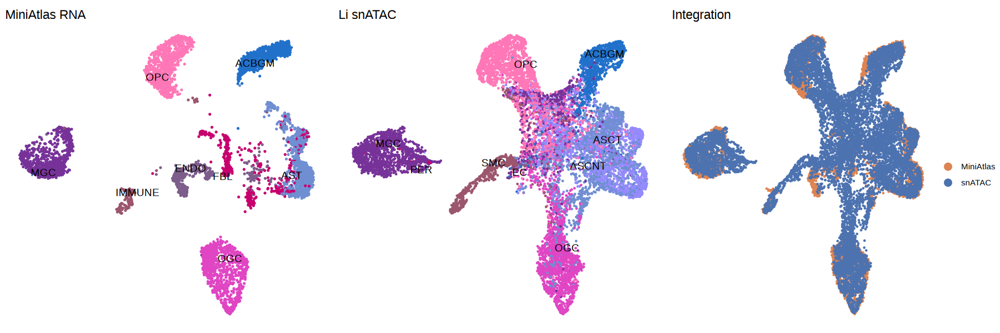

In [440]:
t1 <- DimPlot(ref2, cols = ccol2, group.by = "subclass_corrected", 
              cells = rownames(ref2@meta.data[ref2$orig.ident == "MiniAtlas", ]), 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('MiniAtlas RNA')
t2 <- DimPlot(ref2, cols = bcol, group.by = "subclass", 
              cells = rownames(ref2@meta.data[ref2$orig.ident == "snATAC", ]), 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('Li snATAC')
t3 <- DimPlot(ref2, group.by = "orig.ident", cols = c("#dd8452", "#4c72b0"), label = F, repel = T) + theme_void() + ggtitle('Integration')

options(repr.plot.width = 15, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

## Plot integration for snm3C and DPT RNA

In [359]:
ref1 <- qs::qread('../06.integration/MiniAtlas_snm3c_int_wubin_250717_Neu.qs')
ref2 <- qs::qread('../06.integration/MiniAtlas_snm3c_int_wubin_250717_NonN.qs')

Using ovlpScore as value column: use value.var to override.



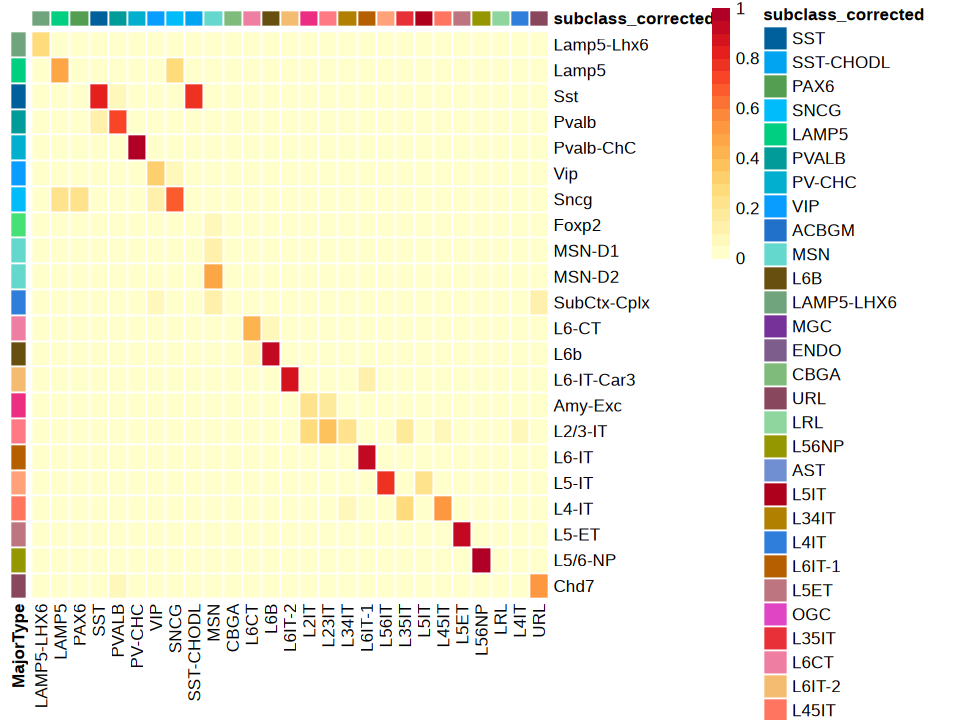

In [424]:
### neu
ranno <- as.data.frame(names(ccol2)) %>% setNames("subclass_corrected")
rownames(ranno) <- ranno[,1]

canno <- ref1@meta.data[ref1$Modality == "mC", "_MajorType"] %>% unique %>% as.data.frame %>% setNames("MajorType")
rownames(canno) <- canno$MajorType

bcol <- c("#b65f00", "#099dff", "#03afcf", "#ff7560", "#00609b", "#bd7580", "#88475c", "#674f10",
         "#ee7ea2", "#ffa179", "#64d8cd", "#ec2e82", "#64d8cd", "#019c99", "#ff7985", "#307edc", "#46e176",
          "#00bcfa", "#70a47c", "#00ce80", "#f4bc71", "#959700")
names(bcol) <- c('L6-IT', 'Vip', 'Pvalb-ChC', 'L4-IT', 'Sst', 'L5-ET', 'Chd7' ,'L6b', 'L6-CT', 'L5-IT', 
  'MSN-D1', 'Amy-Exc', 'MSN-D2', 'Pvalb', 'L2/3-IT', 'SubCtx-Cplx', 'Foxp2', 'Sncg', 'Lamp5-Lhx6', 
  'Lamp5' ,'L6-IT-Car3', 'L5/6-NP')

rannocolor <- list(subclass_corrected = ccol2,
                   MajorType = bcol)

t1 <- ref1@meta.data[ref1$Modality == "RNA", c("seurat_clusters", "subclass_corrected")]
t2 <- ref1@meta.data[ref1$Modality == "mC", c("seurat_clusters", "_MajorType")] %>% 
filter(`_MajorType` %in% names(which(table(ref1$`_MajorType`) > 20)))
ovlp_score <- cal_ovlpScore(t1, t2)

rmat <- ovlp_score %>%
reshape2::dcast(anno1 ~ anno2) %>%
tibble::column_to_rownames("anno1") %>% t

ctk <- which(apply(rmat, 1, max) > 0.05)
rmat <- rmat[ctk, intersect(corder, colnames(rmat))]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat1 <- rmat[permutation_vector, ]
 
options(repr.plot.width = 8, repr.plot.height = 6)
p1 <- smat1 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(0, 1, 0.05),
         border_color = "white", angle_col = 90,
         annotation_colors = rannocolor, 
         annotation_row = canno, annotation_col = ranno,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(20))

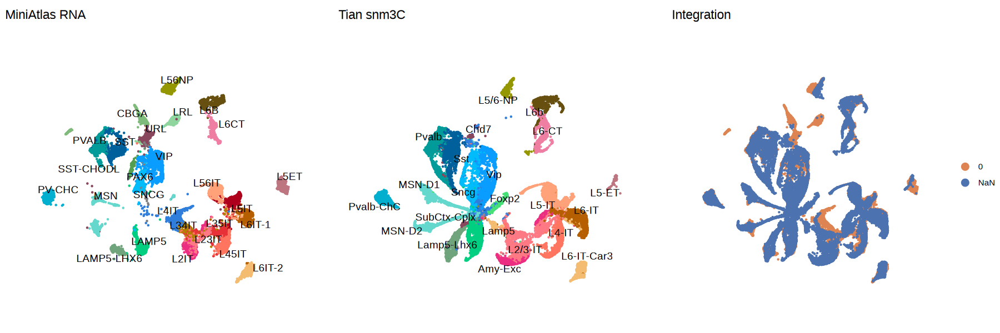

In [427]:
t1 <- DimPlot(ref1, cols = ccol2, group.by = "subclass_corrected", 
              cells = rownames(ref1@meta.data[ref1$Modality == "RNA", ]), reduction = "umap", 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('MiniAtlas RNA') + xlim(-20, 20) + ylim(-15, 20)
t2 <- DimPlot(ref1, cols = bcol, group.by = "subclass_corrected", 
              cells = rownames(ref1@meta.data[ref1$Modality == "mC", ]), reduction = "umap",  
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('Tian snm3C') + xlim(-20, 20) + ylim(-15, 20)
t3 <- DimPlot(ref1, group.by = "orig.ident", reduction = "umap",  
              cols = c("#dd8452", "#4c72b0"), label = F, repel = T) + theme_void() + ggtitle('Integration') + xlim(-20, 20) + ylim(-15, 20)

options(repr.plot.width = 15, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1

Using ovlpScore as value column: use value.var to override.



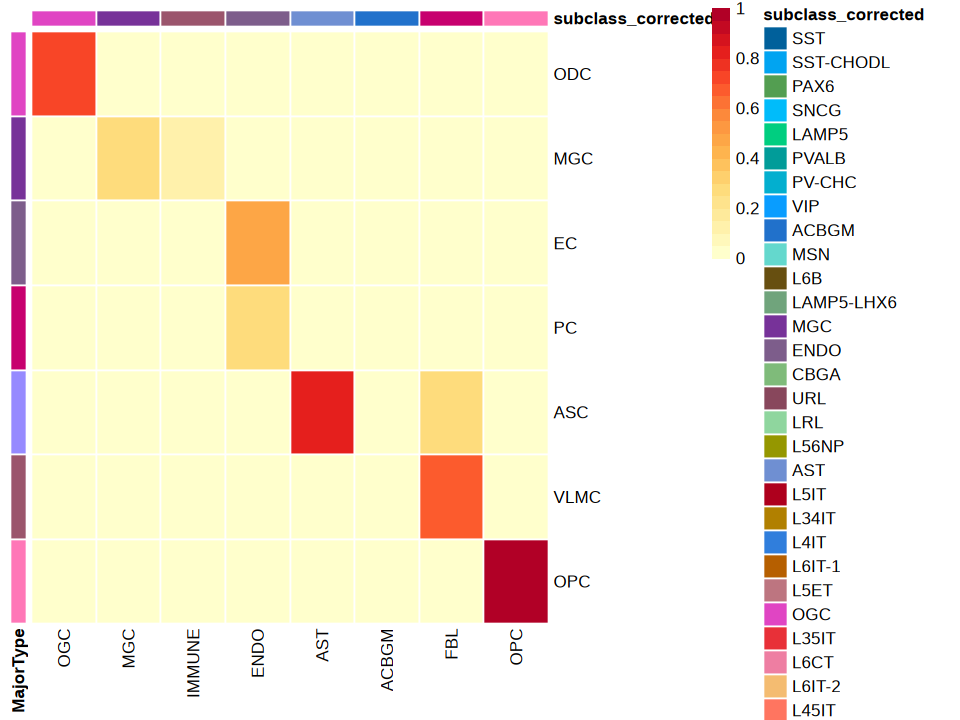

In [412]:
### nonn
canno <- ref2@meta.data[ref2$Modality == "mC", "_MajorType"] %>% unique %>% as.data.frame %>% setNames("MajorType")
rownames(canno) <- canno$MajorType

bcol <- c('#7d5d8b', '#9b556c', '#e045c3', '#968aff', '#ff77b7', '#c7006e', '#773299')
names(bcol) <- c("EC", "VLMC", "ODC", "ASC", "OPC", "PC", "MGC")

rannocolor <- list(subclass_corrected = ccol2,
                   MajorType = bcol)

t1 <- ref2@meta.data[ref2$Modality == "RNA", c("seurat_clusters", "subclass_corrected")]
t2 <- ref2@meta.data[ref2$Modality == "mC", c("seurat_clusters", "_MajorType")] %>% 
filter(`_MajorType` %in% names(which(table(ref2$`_MajorType`) > 5)))
ovlp_score <- cal_ovlpScore(t1, t2)

rmat <- ovlp_score %>%
reshape2::dcast(anno1 ~ anno2) %>%
tibble::column_to_rownames("anno1") %>% t

ctk <- which(apply(rmat, 1, max) > 0.05)
rmat <- rmat[ctk, intersect(corder, colnames(rmat))]
max_indices <- max.col(rmat)
permutation_vector <- order(max_indices)
smat2 <- rmat[permutation_vector, ]
 
options(repr.plot.width = 8, repr.plot.height = 6)
p1 <- smat2 %>% 
pheatmap(cluster_rows = F, cluster_cols = F, breaks = seq(0, 1, 0.05),
         border_color = "white", angle_col = 90,
         annotation_colors = rannocolor, 
         annotation_row = canno, annotation_col = ranno,
         color = colorRampPalette(brewer.pal(n = 8, name = "YlOrRd"))(20))

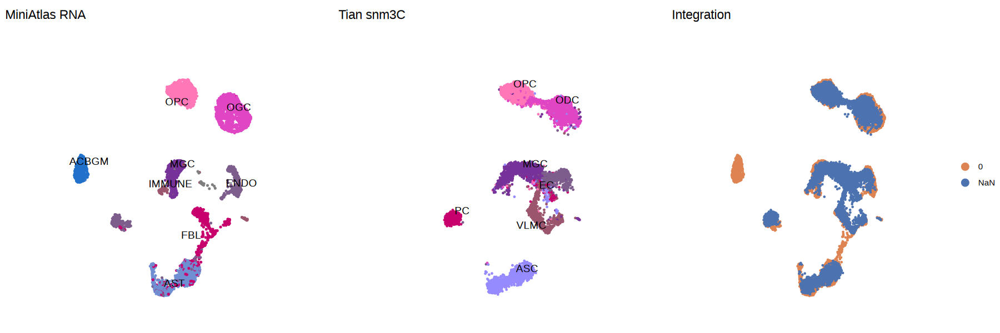

In [421]:
t1 <- DimPlot(ref2, cols = ccol2, group.by = "subclass_corrected", 
              cells = rownames(ref2@meta.data[ref2$Modality == "RNA", ]), reduction = "umap", 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('MiniAtlas RNA') + xlim(-20, 15) + ylim(-15, 15)
t2 <- DimPlot(ref2, cols = bcol, group.by = "subclass_corrected", 
              cells = rownames(ref2@meta.data[ref2$Modality == "mC", ]), reduction = "umap", 
              label = T, repel = T) + theme_void() + NoLegend() + ggtitle('Tian snm3C') + xlim(-20, 15) + ylim(-15, 15)
t3 <- DimPlot(ref2, group.by = "orig.ident", reduction = "umap", 
              cols = c("#dd8452", "#4c72b0"), label = F, repel = T) + theme_void() + ggtitle('Integration') + xlim(-20, 15) + ylim(-15, 15)

options(repr.plot.width = 15, repr.plot.height = 5)
fig1 <- cowplot::plot_grid(t1, t2, t3, ncol = 3)
fig1